In [1]:
# U-Net
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

import datetime
%matplotlib inline

In [2]:
#from tensorflow.python.client import device_lib
#device_lib.list_local_devices()

In [3]:
#mirrored_strategy = tf.distribute.MirroredStrategy(["/GPU:0","/GPU:1", "/GPU:2"], cross_device_ops = tf.distribute.HierarchicalCopyAllReduce())

In [4]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 100
strides = 1
input_size = 100
lr=5e-04
batch_size=20

In [5]:
alpha = np.linspace(-10,20,16).reshape((16,1))

In [6]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [7]:
aa = aa.reshape((133, 16, 1, 1))

In [8]:
os.chdir('D:\\AeroCNN2Inputs')

In [9]:
origin = "D:\\AeroCNN2Inputs2"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_poisson = "D:\\CNN_poisson_files\\poisson\\bc2"

In [10]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [11]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data], axis=0)

In [12]:
image_np = image_df.iloc[:, :].values

In [13]:
image = image_np.reshape((133, 16, n_grid, n_grid))

In [14]:
image = 1-image/100

In [15]:
field_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin_poisson + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        field_df = pd.concat([field_df, data], axis=0)

In [16]:
field_np = field_df.iloc[:, :].values

In [17]:
imr = SimpleImputer(missing_values=np.nan, strategy='mean')
imr = imr.fit(field_np)
imputed_field = imr.transform(field_np)

In [18]:
field = imputed_field.reshape((133, 16, n_grid+1, n_grid+1))

In [19]:
field_nor = (field-np.min(field))/(np.max(field)-np.min(field))

In [20]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 1].values

In [21]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [22]:
geometry.shape

(2128, 1)

In [23]:
geometry = geometry.reshape((133, 16, 1))

In [24]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(image, aa, geometry, field_nor, test_size=0.1, random_state=1)

In [25]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(x_all, aa_all, geo_all, y_all, test_size=0.1, random_state=1)

In [26]:
x_train = x_train.reshape((x_train.shape[0]*x_train.shape[1], x_train.shape[2], x_train.shape[3], 1))
x_val = x_val.reshape((x_val.shape[0]*x_val.shape[1], x_val.shape[2], x_val.shape[3], 1))
x_test = x_test.reshape((x_test.shape[0]*x_test.shape[1], x_test.shape[2], x_test.shape[3], 1))
aa_train = aa_train.reshape((aa_train.shape[0]*aa_train.shape[1], aa_train.shape[2], aa_train.shape[3]))
aa_val = aa_val.reshape((aa_val.shape[0]*aa_val.shape[1], aa_val.shape[2], aa_val.shape[3]))
aa_test = aa_test.reshape((aa_test.shape[0]*aa_test.shape[1], aa_test.shape[2], aa_test.shape[3]))
geo_train = geo_train.reshape((geo_train.shape[0]*geo_train.shape[1], geo_train.shape[2]))
geo_val = geo_val.reshape((geo_val.shape[0]*geo_val.shape[1], geo_val.shape[2]))
geo_test = geo_test.reshape((geo_test.shape[0]*geo_test.shape[1], geo_test.shape[2]))
y_train = y_train.reshape((y_train.shape[0]*y_train.shape[1], y_train.shape[2], y_train.shape[3], 1))
y_val = y_val.reshape((y_val.shape[0]*y_val.shape[1], y_val.shape[2], y_val.shape[3], 1))
y_test = y_test.reshape((y_test.shape[0]*y_test.shape[1], y_test.shape[2], y_test.shape[3], 1))

In [27]:
tf.keras.backend.set_image_data_format('channels_last')

In [29]:
#with mirrored_strategy.scope():
input_image = tf.keras.Input(shape=(n_grid, n_grid, 1))
#reshape0 = tf.keras.layers.Reshape(())

x_conv1 = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer1')(input_image)
x_1 = tf.keras.layers.MaxPooling2D((2,2))(x_conv1)
x_conv2 = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer2')(x_1)
x_2 = tf.keras.layers.MaxPooling2D((2,2))(x_conv2)

x_deconv1 = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                            strides=(2,2),
                                            activation='relu', padding='same',
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            name='Conv2DTLayer1')(x_2)
x_concat1 = tf.concat([x_conv2, x_deconv1], axis=-1)
x_deconv2 = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                            strides=(2,2),
                                            activation='relu', padding='same',
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            name='Conv2DTLayer2')(x_concat1)
x_concat2 = tf.concat([x_conv1, x_deconv2], axis=-1)

x_conv_final = tf.keras.layers.Conv2D(1, (1, 1), strides=(strides, strides),
                                      activation='relu', padding='same',
                                      kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                      name='Conv2DLayerFinal')(x_concat2)
x_ = tf.keras.layers.Flatten()(x_conv_final)
x_ = tf.keras.layers.Dense(units=(n_grid+1)**2, activation='linear', name='FCLayer1',
                           kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_)
#x_ = tf.keras.layers.Dense(units=101*101, activation='linear', name='outputLayer')(x_)
output_data = tf.keras.layers.Reshape((n_grid+1,n_grid+1,1))(x_)

# AeroCNN-II
model = tf.keras.Model(input_image, output_data)

In [30]:
#with mirrored_strategy.scope():
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 100, 100, 1  0           []                               
                                )]                                                                
                                                                                                  
 Conv2DLayer1 (Conv2D)          (None, 100, 100, 10  1000        ['input_2[0][0]']                
                                0)                                                                
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 50, 50, 100)  0          ['Conv2DLayer1[0][0]']           
                                                                                              

In [31]:
#with mirrored_strategy.scope():
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [32]:
#with mirrored_strategy.scope():
start = datetime.datetime.now()
history = model.fit(x_train, y_train, validation_data=[x_val, y_val],
                    epochs=5000, shuffle=True, batch_size=batch_size,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100,
                                                                restore_best_weights=True)])
end = datetime.datetime.now()

Epoch 1/5000
86/86 [==============================] - 12s 59ms/step - loss: 0.0540 - rmse: 0.2325 - val_loss: 0.0017 - val_rmse: 0.0411
Epoch 2/5000
86/86 [==============================] - 3s 39ms/step - loss: 0.0014 - rmse: 0.0372 - val_loss: 3.5848e-04 - val_rmse: 0.0186
Epoch 3/5000
86/86 [==============================] - 3s 39ms/step - loss: 4.7024e-04 - rmse: 0.0214 - val_loss: 1.9560e-04 - val_rmse: 0.0136
Epoch 4/5000
86/86 [==============================] - 3s 39ms/step - loss: 2.2771e-04 - rmse: 0.0147 - val_loss: 2.2965e-04 - val_rmse: 0.0148
Epoch 5/5000
86/86 [==============================] - 3s 39ms/step - loss: 2.0503e-04 - rmse: 0.0139 - val_loss: 1.0259e-04 - val_rmse: 0.0096
Epoch 6/5000
86/86 [==============================] - 3s 39ms/step - loss: 1.5764e-04 - rmse: 0.0121 - val_loss: 1.0364e-04 - val_rmse: 0.0096
Epoch 7/5000
86/86 [==============================] - 3s 38ms/step - loss: 1.4475e-04 - rmse: 0.0116 - val_loss: 8.8254e-05 - val_rmse: 0.0088
Epoch 8/50

86/86 [==============================] - 3s 39ms/step - loss: 5.1476e-05 - rmse: 0.0064 - val_loss: 4.2585e-05 - val_rmse: 0.0056
Epoch 59/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.4312e-05 - rmse: 0.0066 - val_loss: 4.2111e-05 - val_rmse: 0.0056
Epoch 60/5000
86/86 [==============================] - 3s 39ms/step - loss: 4.5261e-05 - rmse: 0.0059 - val_loss: 6.9767e-05 - val_rmse: 0.0077
Epoch 61/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.8088e-05 - rmse: 0.0069 - val_loss: 9.0617e-05 - val_rmse: 0.0089
Epoch 62/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.1026e-04 - rmse: 0.0100 - val_loss: 7.9391e-05 - val_rmse: 0.0083
Epoch 63/5000
86/86 [==============================] - 3s 39ms/step - loss: 4.1737e-05 - rmse: 0.0056 - val_loss: 3.7936e-05 - val_rmse: 0.0052
Epoch 64/5000
86/86 [==============================] - 3s 39ms/step - loss: 3.9203e-05 - rmse: 0.0053 - val_loss: 1.1308e-04 - val_rmse: 0.0101
Epoch 

Epoch 115/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.1295e-05 - rmse: 0.0070 - val_loss: 6.2754e-05 - val_rmse: 0.0071
Epoch 116/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.4318e-05 - rmse: 0.0072 - val_loss: 9.9029e-05 - val_rmse: 0.0093
Epoch 117/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.2677e-05 - rmse: 0.0071 - val_loss: 6.3296e-05 - val_rmse: 0.0071
Epoch 118/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.6452e-05 - rmse: 0.0066 - val_loss: 5.3996e-05 - val_rmse: 0.0064
Epoch 119/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.8556e-05 - rmse: 0.0068 - val_loss: 6.8717e-05 - val_rmse: 0.0075
Epoch 120/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.4863e-05 - rmse: 0.0072 - val_loss: 5.4925e-05 - val_rmse: 0.0065
Epoch 121/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.7053e-05 - rmse: 0.0067 - val_loss: 7.0346e-05 - va

86/86 [==============================] - 3s 37ms/step - loss: 2.0707e-05 - rmse: 0.0032 - val_loss: 2.8574e-05 - val_rmse: 0.0042
Epoch 228/5000
86/86 [==============================] - 3s 37ms/step - loss: 2.0800e-05 - rmse: 0.0032 - val_loss: 2.9300e-05 - val_rmse: 0.0043
Epoch 229/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.8514e-05 - rmse: 0.0028 - val_loss: 3.2881e-05 - val_rmse: 0.0047
Epoch 230/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.9985e-05 - rmse: 0.0030 - val_loss: 4.9068e-05 - val_rmse: 0.0062
Epoch 231/5000
86/86 [==============================] - 3s 37ms/step - loss: 2.2818e-05 - rmse: 0.0035 - val_loss: 2.6572e-05 - val_rmse: 0.0040
Epoch 232/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.8520e-05 - rmse: 0.0028 - val_loss: 2.9763e-05 - val_rmse: 0.0044
Epoch 233/5000
86/86 [==============================] - 3s 37ms/step - loss: 2.1882e-05 - rmse: 0.0033 - val_loss: 3.6264e-05 - val_rmse: 0.0051


86/86 [==============================] - 3s 37ms/step - loss: 1.3212e-05 - rmse: 0.0020 - val_loss: 2.0268e-05 - val_rmse: 0.0033
Epoch 340/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.2759e-05 - rmse: 0.0019 - val_loss: 2.3735e-05 - val_rmse: 0.0038
Epoch 341/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.6476e-05 - rmse: 0.0027 - val_loss: 2.2152e-05 - val_rmse: 0.0036
Epoch 342/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.4182e-05 - rmse: 0.0023 - val_loss: 2.4151e-05 - val_rmse: 0.0039
Epoch 343/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.3796e-05 - rmse: 0.0022 - val_loss: 2.8463e-05 - val_rmse: 0.0044
Epoch 344/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.5000e-05 - rmse: 0.0024 - val_loss: 2.1883e-05 - val_rmse: 0.0036
Epoch 345/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.3982e-05 - rmse: 0.0022 - val_loss: 1.9483e-05 - val_rmse: 0.0032


86/86 [==============================] - 3s 39ms/step - loss: 9.7449e-06 - rmse: 0.0014 - val_loss: 1.7419e-05 - val_rmse: 0.0031
Epoch 452/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.1343e-05 - rmse: 0.0019 - val_loss: 1.8097e-05 - val_rmse: 0.0032
Epoch 453/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.9155e-06 - rmse: 0.0015 - val_loss: 2.5925e-05 - val_rmse: 0.0043
Epoch 454/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.1086e-05 - rmse: 0.0018 - val_loss: 1.8217e-05 - val_rmse: 0.0032
Epoch 455/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.0866e-05 - rmse: 0.0018 - val_loss: 1.7885e-05 - val_rmse: 0.0032
Epoch 456/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.3859e-05 - rmse: 0.0025 - val_loss: 2.8669e-05 - val_rmse: 0.0046
Epoch 457/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.4391e-05 - rmse: 0.0026 - val_loss: 2.1515e-05 - val_rmse: 0.0037


86/86 [==============================] - 3s 37ms/step - loss: 9.8156e-06 - rmse: 0.0018 - val_loss: 1.9800e-05 - val_rmse: 0.0036
Epoch 564/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.1427e-06 - rmse: 0.0016 - val_loss: 1.7232e-05 - val_rmse: 0.0033
Epoch 565/5000
86/86 [==============================] - 3s 37ms/step - loss: 8.5035e-06 - rmse: 0.0014 - val_loss: 1.8317e-05 - val_rmse: 0.0034
Epoch 566/5000
86/86 [==============================] - 3s 37ms/step - loss: 8.5594e-06 - rmse: 0.0014 - val_loss: 1.9199e-05 - val_rmse: 0.0036
Epoch 567/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.2329e-06 - rmse: 0.0016 - val_loss: 1.9690e-05 - val_rmse: 0.0036
Epoch 568/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.1571e-06 - rmse: 0.0016 - val_loss: 1.8312e-05 - val_rmse: 0.0034
Epoch 569/5000
86/86 [==============================] - 3s 37ms/step - loss: 8.4872e-06 - rmse: 0.0014 - val_loss: 1.6870e-05 - val_rmse: 0.0032


86/86 [==============================] - 3s 37ms/step - loss: 7.3534e-06 - rmse: 0.0013 - val_loss: 1.7775e-05 - val_rmse: 0.0035
Epoch 676/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.5721e-06 - rmse: 0.0020 - val_loss: 1.9355e-05 - val_rmse: 0.0037
Epoch 677/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.6353e-05 - rmse: 0.0033 - val_loss: 4.2594e-05 - val_rmse: 0.0061
Epoch 678/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.6058e-05 - rmse: 0.0032 - val_loss: 1.7745e-05 - val_rmse: 0.0035
Epoch 679/5000
86/86 [==============================] - 3s 37ms/step - loss: 8.9744e-06 - rmse: 0.0018 - val_loss: 1.6417e-05 - val_rmse: 0.0033
Epoch 680/5000
86/86 [==============================] - 3s 37ms/step - loss: 7.4334e-06 - rmse: 0.0014 - val_loss: 1.5413e-05 - val_rmse: 0.0031
Epoch 681/5000
86/86 [==============================] - 3s 37ms/step - loss: 7.6665e-06 - rmse: 0.0014 - val_loss: 1.5291e-05 - val_rmse: 0.0031


86/86 [==============================] - 3s 37ms/step - loss: 8.1790e-06 - rmse: 0.0018 - val_loss: 1.3248e-05 - val_rmse: 0.0029
Epoch 788/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.5072e-06 - rmse: 0.0013 - val_loss: 1.5801e-05 - val_rmse: 0.0033
Epoch 789/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.6327e-06 - rmse: 0.0013 - val_loss: 1.6022e-05 - val_rmse: 0.0033
Epoch 790/5000
86/86 [==============================] - 3s 37ms/step - loss: 7.7240e-06 - rmse: 0.0017 - val_loss: 1.4121e-05 - val_rmse: 0.0030
Epoch 791/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.6288e-06 - rmse: 0.0022 - val_loss: 1.8393e-05 - val_rmse: 0.0037
Epoch 792/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.0483e-05 - rmse: 0.0024 - val_loss: 1.6387e-05 - val_rmse: 0.0034
Epoch 793/5000
86/86 [==============================] - 3s 37ms/step - loss: 9.1912e-06 - rmse: 0.0021 - val_loss: 1.5487e-05 - val_rmse: 0.0033


86/86 [==============================] - 3s 37ms/step - loss: 7.8813e-06 - rmse: 0.0019 - val_loss: 1.6472e-05 - val_rmse: 0.0035
Epoch 900/5000
86/86 [==============================] - 3s 37ms/step - loss: 8.8537e-06 - rmse: 0.0022 - val_loss: 1.9719e-05 - val_rmse: 0.0039
Epoch 901/5000
86/86 [==============================] - 3s 37ms/step - loss: 7.2946e-06 - rmse: 0.0018 - val_loss: 1.3652e-05 - val_rmse: 0.0031
Epoch 902/5000
86/86 [==============================] - 3s 37ms/step - loss: 6.6890e-06 - rmse: 0.0016 - val_loss: 1.4222e-05 - val_rmse: 0.0032
Epoch 903/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.4565e-06 - rmse: 0.0011 - val_loss: 1.5060e-05 - val_rmse: 0.0033
Epoch 904/5000
86/86 [==============================] - 3s 37ms/step - loss: 8.4370e-06 - rmse: 0.0021 - val_loss: 3.3768e-05 - val_rmse: 0.0054
Epoch 905/5000
86/86 [==============================] - 3s 37ms/step - loss: 1.1095e-05 - rmse: 0.0026 - val_loss: 1.4521e-05 - val_rmse: 0.0032


86/86 [==============================] - 3s 37ms/step - loss: 4.8921e-06 - rmse: 0.0011 - val_loss: 1.1985e-05 - val_rmse: 0.0029
Epoch 1012/5000
86/86 [==============================] - 3s 37ms/step - loss: 4.6954e-06 - rmse: 0.0010 - val_loss: 1.1938e-05 - val_rmse: 0.0029
Epoch 1013/5000
86/86 [==============================] - 3s 41ms/step - loss: 4.3038e-06 - rmse: 8.3619e-04 - val_loss: 1.1942e-05 - val_rmse: 0.0029
Epoch 1014/5000
86/86 [==============================] - 3s 39ms/step - loss: 4.1555e-06 - rmse: 7.4575e-04 - val_loss: 1.3139e-05 - val_rmse: 0.0031
Epoch 1015/5000
86/86 [==============================] - 3s 37ms/step - loss: 4.5256e-06 - rmse: 9.6507e-04 - val_loss: 1.3676e-05 - val_rmse: 0.0032
Epoch 1016/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.2830e-06 - rmse: 0.0013 - val_loss: 1.2760e-05 - val_rmse: 0.0030
Epoch 1017/5000
86/86 [==============================] - 3s 37ms/step - loss: 7.3419e-06 - rmse: 0.0019 - val_loss: 2.0558e-05 -

86/86 [==============================] - 3s 37ms/step - loss: 1.1128e-05 - rmse: 0.0028 - val_loss: 3.5780e-05 - val_rmse: 0.0057
Epoch 1068/5000
86/86 [==============================] - 3s 37ms/step - loss: 7.3713e-06 - rmse: 0.0020 - val_loss: 1.4836e-05 - val_rmse: 0.0034
Epoch 1069/5000
86/86 [==============================] - 3s 37ms/step - loss: 4.8322e-06 - rmse: 0.0012 - val_loss: 1.3015e-05 - val_rmse: 0.0031
Epoch 1070/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.0189e-06 - rmse: 0.0013 - val_loss: 1.6032e-05 - val_rmse: 0.0035
Epoch 1071/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.5408e-06 - rmse: 0.0014 - val_loss: 1.5164e-05 - val_rmse: 0.0034
Epoch 1072/5000
86/86 [==============================] - 3s 37ms/step - loss: 5.5248e-06 - rmse: 0.0014 - val_loss: 1.4267e-05 - val_rmse: 0.0033
Epoch 1073/5000
86/86 [==============================] - 3s 37ms/step - loss: 4.9812e-06 - rmse: 0.0012 - val_loss: 1.4530e-05 - val_rmse: 0

In [33]:
time = end - start
print("Training time:", time)

Training time: 0:58:58.207567


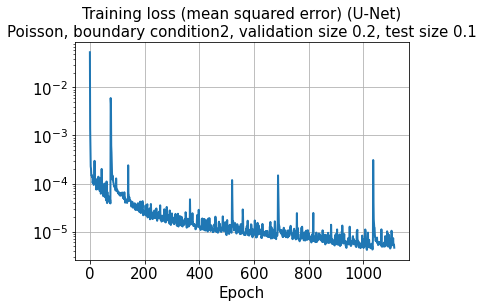

In [34]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.title('Training loss (mean squared error) (U-Net)\nPoisson, boundary condition2, validation size 0.2, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

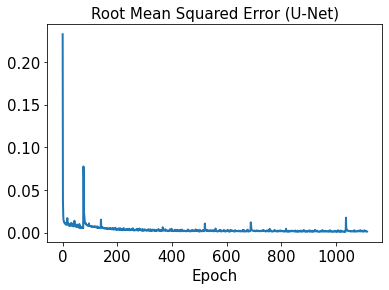

In [35]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error (U-Net)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

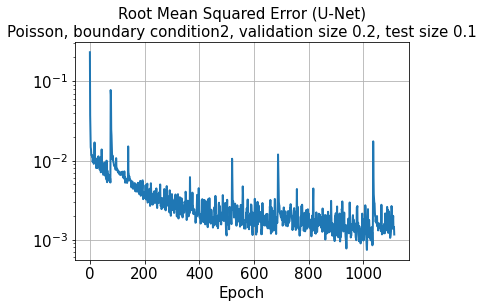

In [36]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error (U-Net)\nPoisson, boundary condition2, validation size 0.2, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

In [37]:
#with mirrored_strategy.scope():
test_results = model.evaluate(x_train)

54/54 [==============================] - 0s 3ms/step - loss: 3.5970e-06 - rmse: 0.0000e+00


In [38]:
#with mirrored_strategy.scope():
decoded_train = model.predict(x_train)

54/54 [==============================] - 1s 14ms/step


In [54]:
decoded_val = model.predict(x_val)

6/6 [==============================] - 0s 65ms/step


In [39]:
#with mirrored_strategy.scope():
decoded_test = model.predict(x_test)

7/7 [==============================] - 0s 13ms/step


In [40]:
error_train_abs = np.abs(decoded_train - y_train)

In [89]:
error_val_abs = np.abs(decoded_val - y_val)

In [41]:
error_test_abs = np.abs(decoded_test - y_test)

In [46]:
os.chdir("D:\\TrainedModels\\20221027")
model.save('Poisson_bc2_100kernel_2by2MaxPooling_2CNNlayer_UNet_validationSize0.2testSize0.2.h5',
           overwrite=True, include_optimizer=True, save_format='h5')

In [47]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0012936354531873436


In [55]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.004597061455822825


In [49]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.01083667821642469


In [50]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)
print(l2_error_train_list)

[0.0012493816068713179, 0.0008304995721906454, 0.0007294143089134849, 0.0007926365773459639, 0.0002788309586498277, 0.000742340552400635, 0.0009570162548646214, 0.0004209078699035023, 0.0006415902259426841, 0.0007978359290028236, 0.001459845057559787, 0.0007709565726994906, 0.0009512346824269866, 0.0012287309708866288, 0.0011517900132030482, 0.001186782269265275, 0.0015418201167754246, 0.001887109927011416, 0.0008551435478405405, 0.000395965970937016, 0.0004832807958664275, 0.0003492991691061969, 0.000498204933584971, 0.00037196219763423736, 0.0006044157702016088, 0.0010853188465641279, 0.0016227330405736346, 0.00109882130749823, 0.0012653123283858276, 0.0007014294396655689, 0.0012287828795667847, 0.000886749233436781, 0.0005148818392581815, 0.0007111493803758085, 0.00021767922717938495, 0.00025364397574028264, 0.00036077851510388714, 0.0013109105860193413, 0.0006997230382528273, 0.0014514004354037736, 0.0010325178269629672, 0.0009406777182058935, 0.001775712100365366, 0.00113194858549

In [56]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)
print(l2_error_val_list)

[0.0007424698802274089, 0.00242104294753, 0.0008187523123564429, 0.0022570574294486496, 0.00032856002358461705, 0.0017064004916383607, 0.0012203337233905266, 0.0020357608164012584, 0.0007216634523630677, 0.0008148540521028438, 0.0014500728487077297, 0.0008056511225762526, 0.0006615476635894004, 0.0014593778940702943, 0.002807749437394908, 0.0022946951600132967, 0.0004894320140238886, 0.00041504709269737493, 0.0024390031816558886, 0.0006201473722212778, 0.0013030444718053903, 0.00034361207326676275, 0.0004625875192956207, 0.0005958233702320912, 0.0007894087582100845, 0.0015951053272909904, 0.0011062356390434042, 0.0025817543614652656, 0.0014109041637235702, 0.0019674999082655107, 0.001234735602102662, 0.001567549477345601, 0.005796016357729881, 0.0023732114259412277, 0.006102672600870932, 0.0005447204296223936, 0.00488027711441965, 0.004092041049545676, 0.006482106006040977, 0.002405286460017169, 0.00478996502861698, 0.002958540487371336, 0.0007210723518286398, 0.002921169958977346, 0.0

In [51]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)
print(l2_error_test_list)

[0.0011222947206009778, 0.0004943715059369474, 0.001560030750933845, 0.0007876696954357567, 0.0011803149097001481, 0.0011982437967479863, 0.0008821694052302197, 0.0007757483063020503, 0.0006308560588553678, 0.001273303009184974, 0.0009731441763727981, 0.0010559324457246981, 0.0007216722065101081, 0.0008542211791301195, 0.001656820461748306, 0.0019836689551635082, 0.00574693946489974, 0.004810426901983957, 0.004255132077910796, 0.003961629104117733, 0.006485305033375154, 0.005751082195062025, 0.00739387357907479, 0.006553811613696853, 0.0032979811212859186, 0.002954320662192442, 0.0023465825417868435, 0.010888644335451673, 0.00447503698665407, 0.005787145584797308, 0.000863874042986265, 0.0014206645969952064, 0.0009877712511485947, 0.00026694444731140485, 0.0007892994212833321, 0.0012420918216255925, 0.0006401152462341874, 0.0008976173134303511, 0.000705497208005005, 0.001511135245912139, 0.0006150885606447625, 0.0011689944695757407, 0.0008463644817512683, 0.0010713549960566315, 0.00185

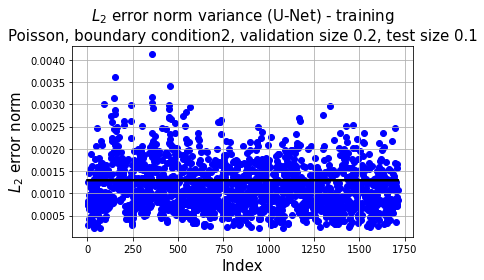

In [52]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance (U-Net) - training\nPoisson, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

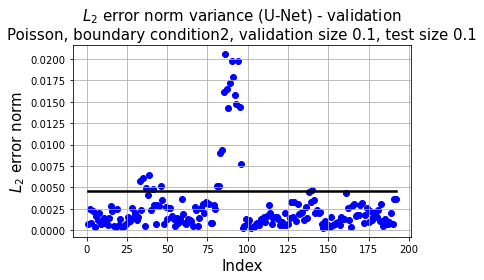

In [57]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_val*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance (U-Net) - validation\nPoisson, boundary condition2, validation size 0.1, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

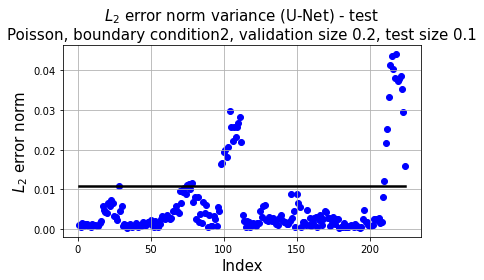

In [58]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance (U-Net) - test\nPoisson, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

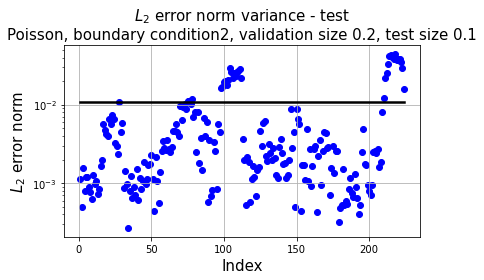

In [59]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - test\nPoisson, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

In [60]:
os.chdir("D:\\CNN_poisson_files\\images\\UNetvalidationSize0.2testSize0.1")

In [61]:
n_grid=101

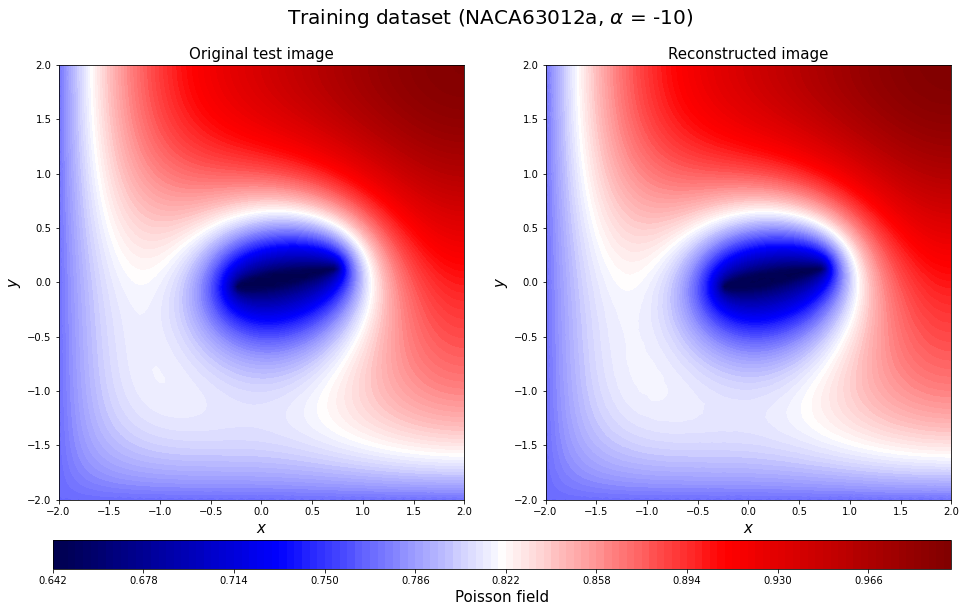

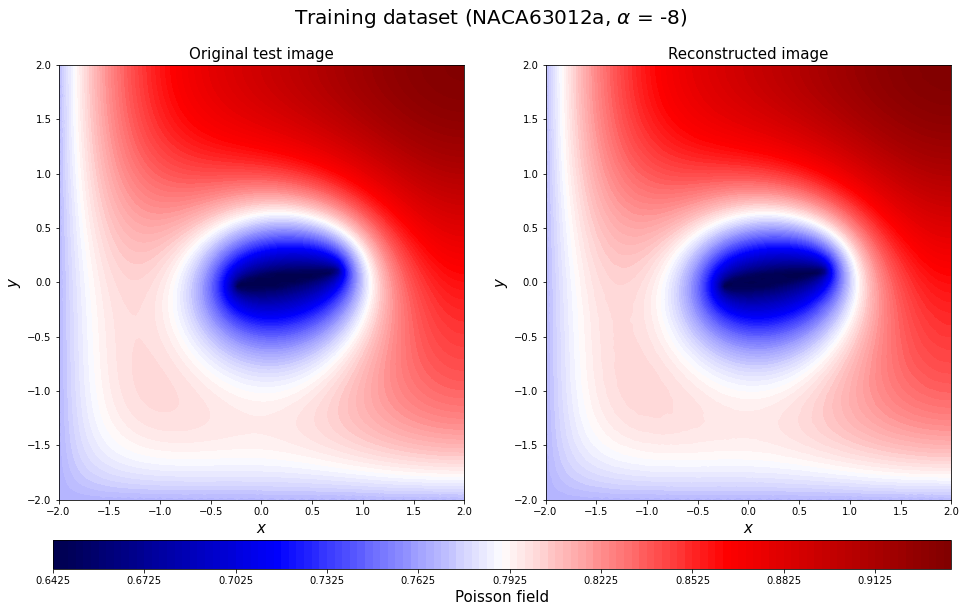

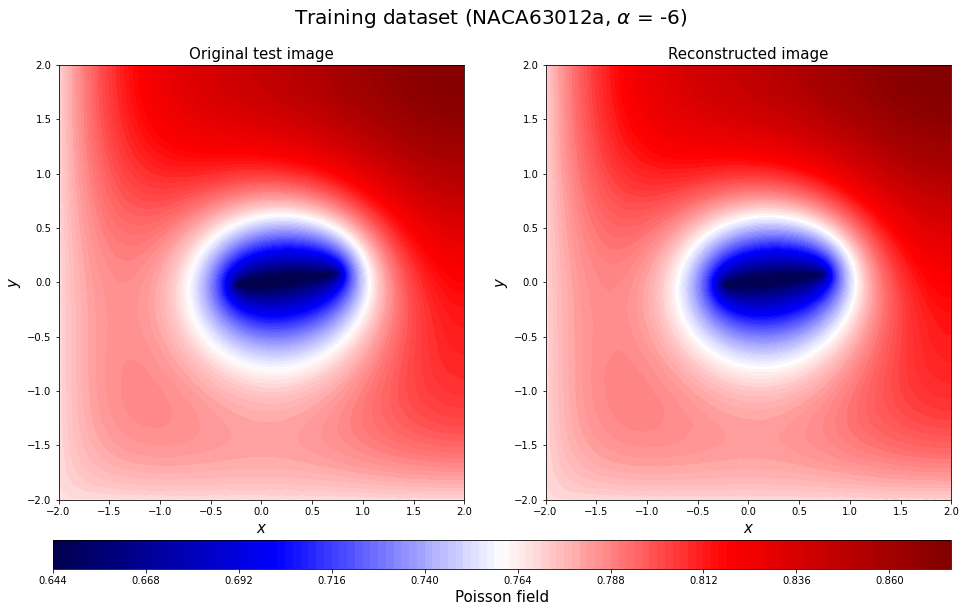

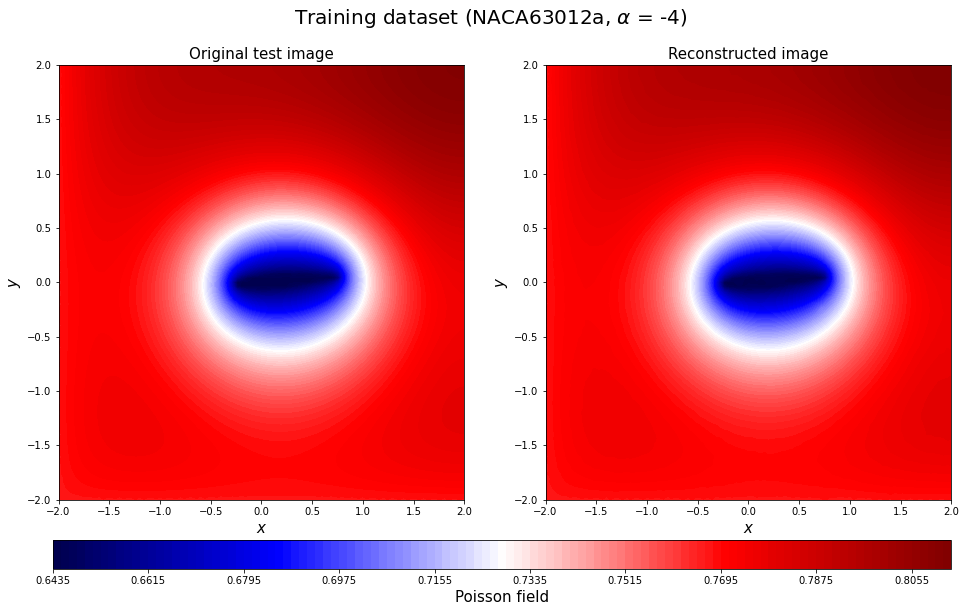

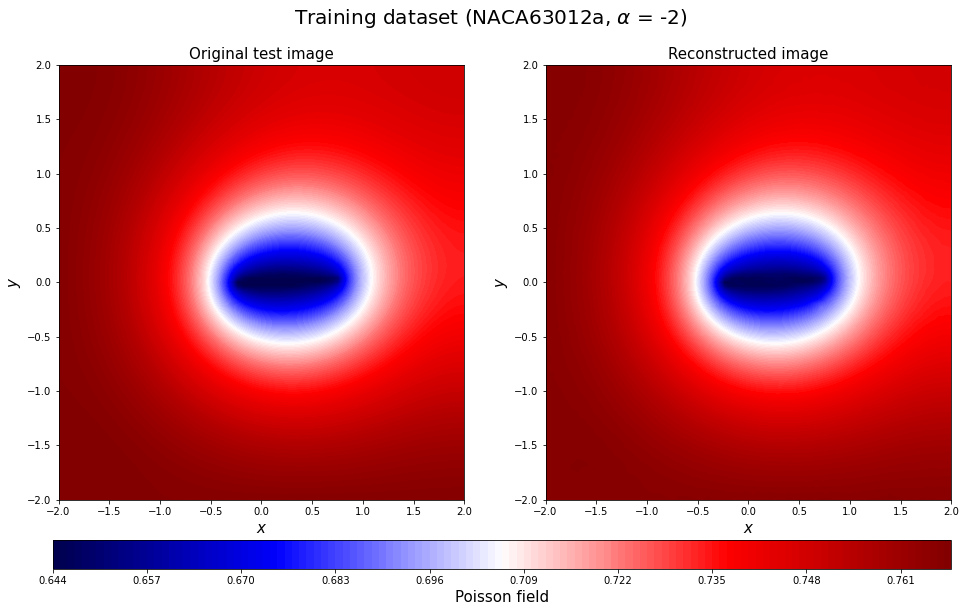

...

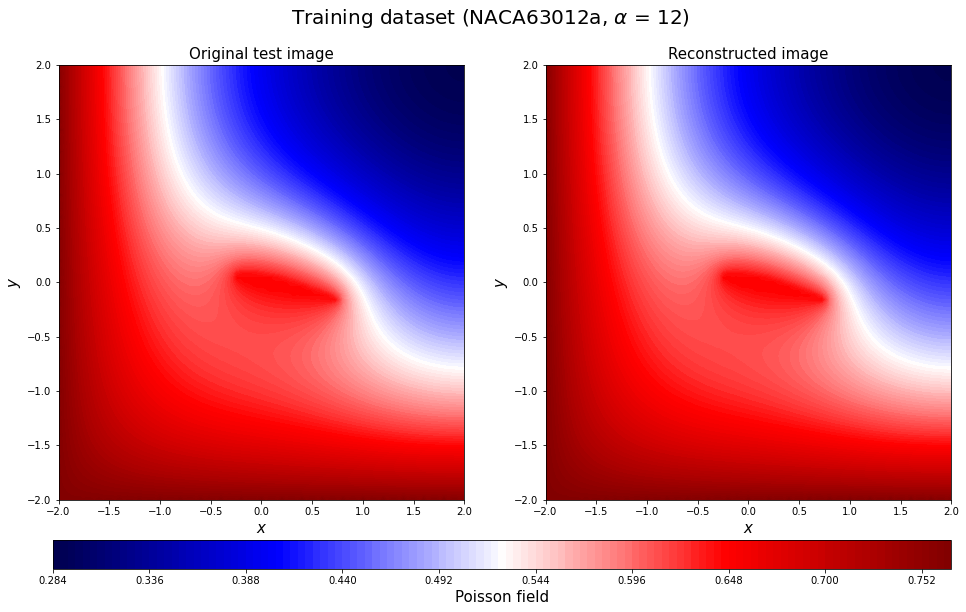

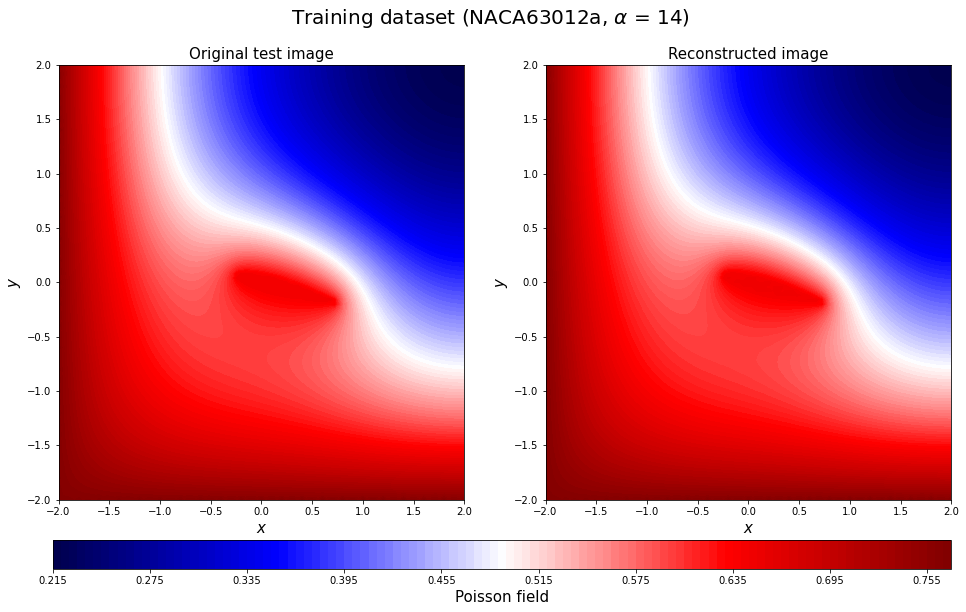

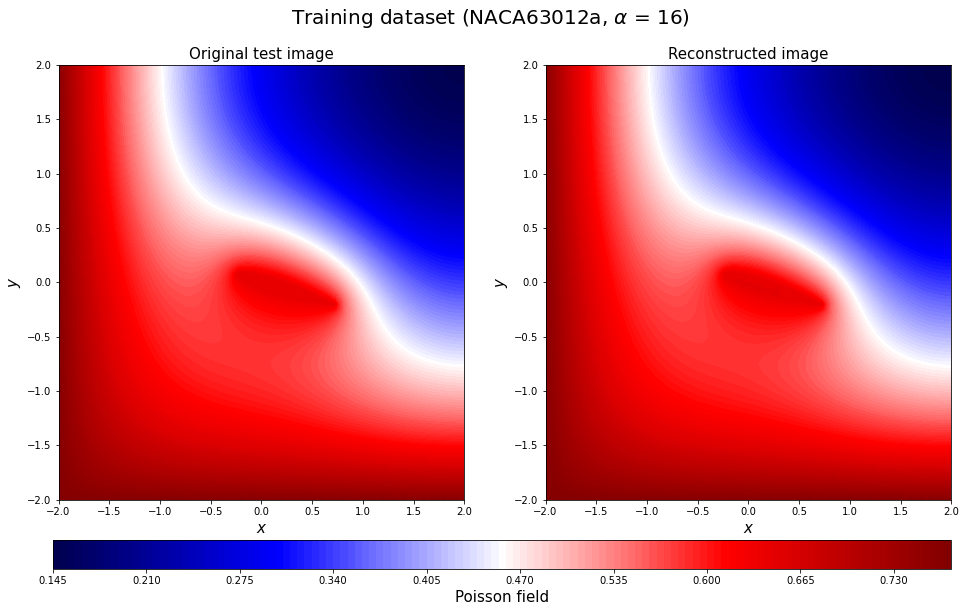

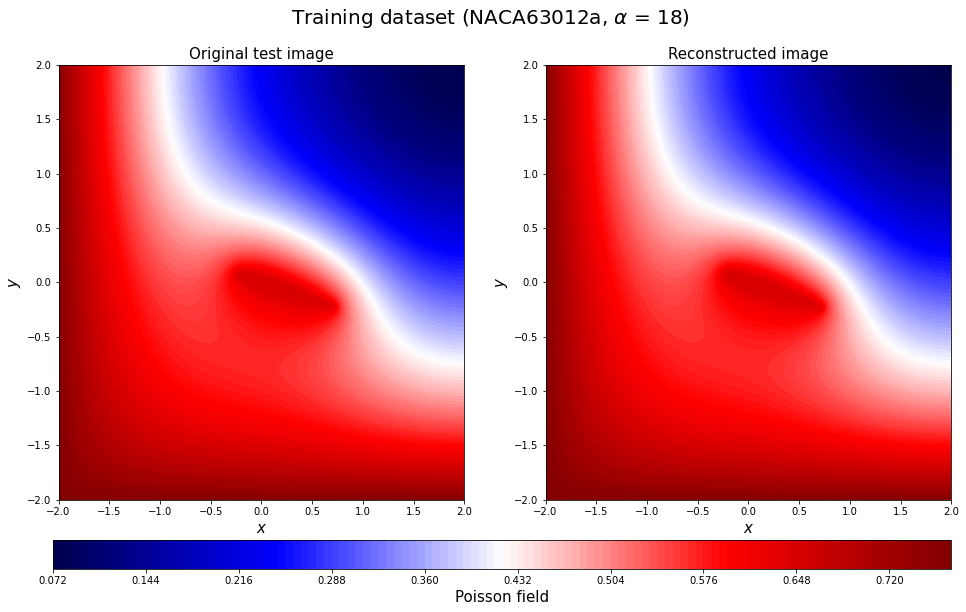

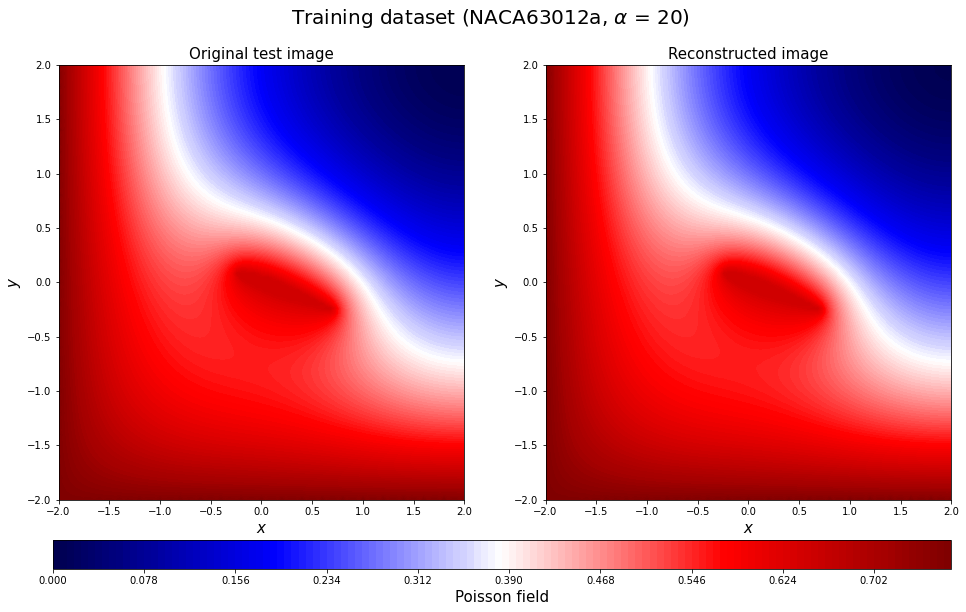

In [62]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate,levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

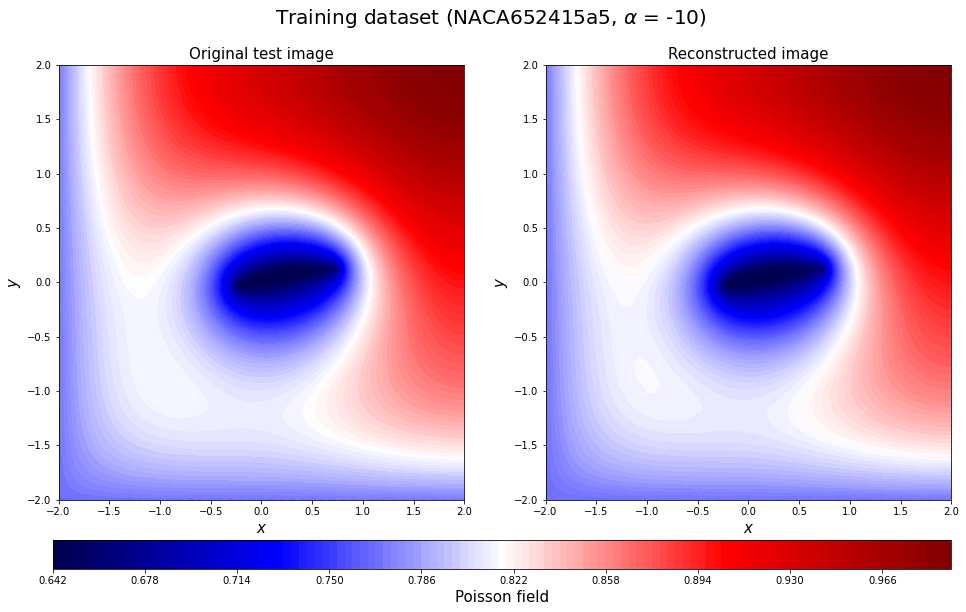

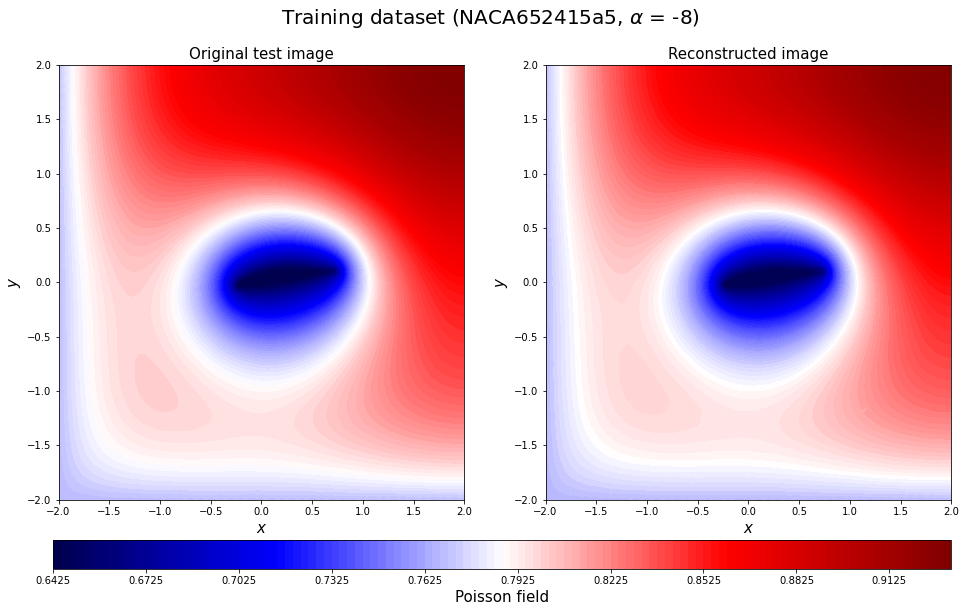

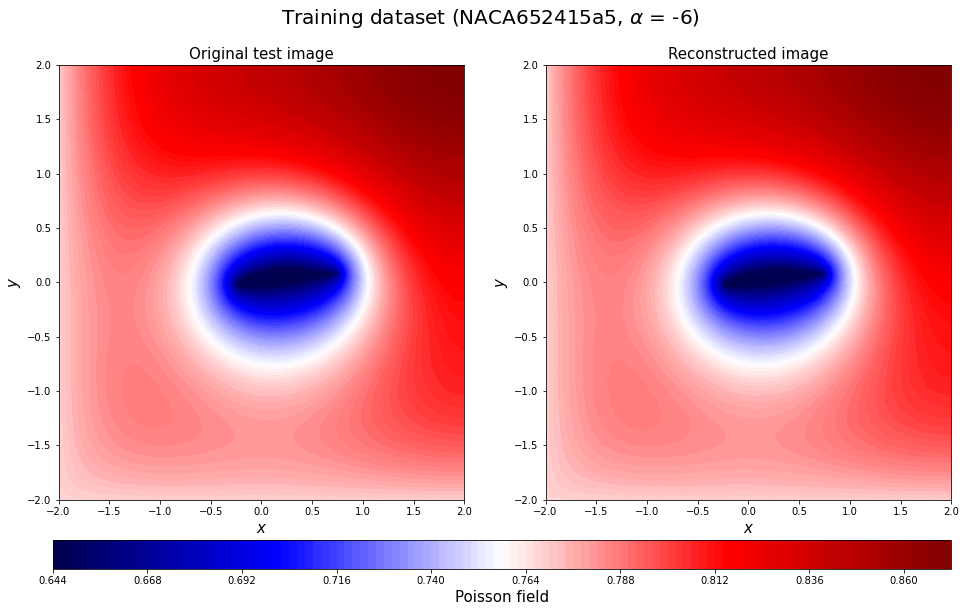

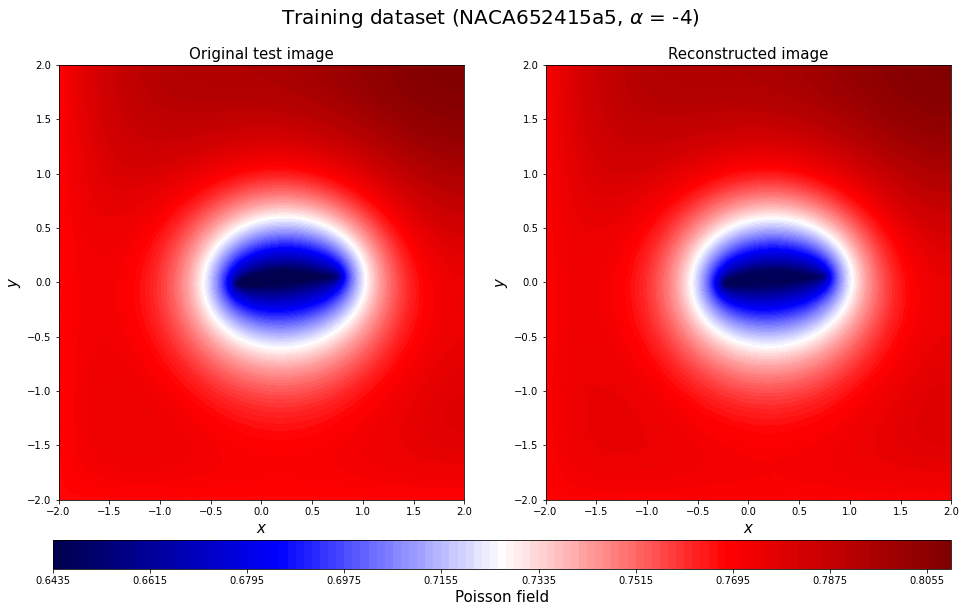

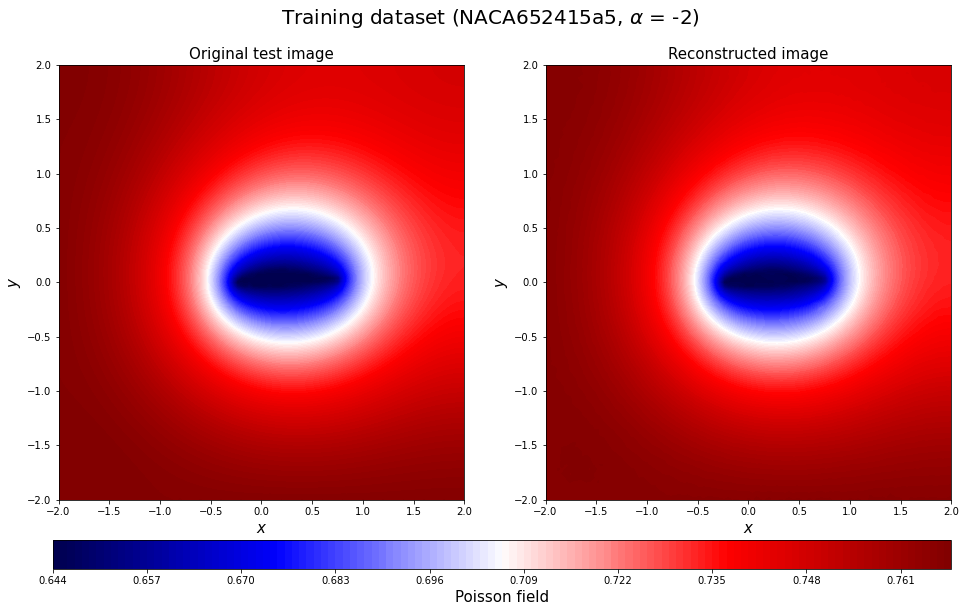

...

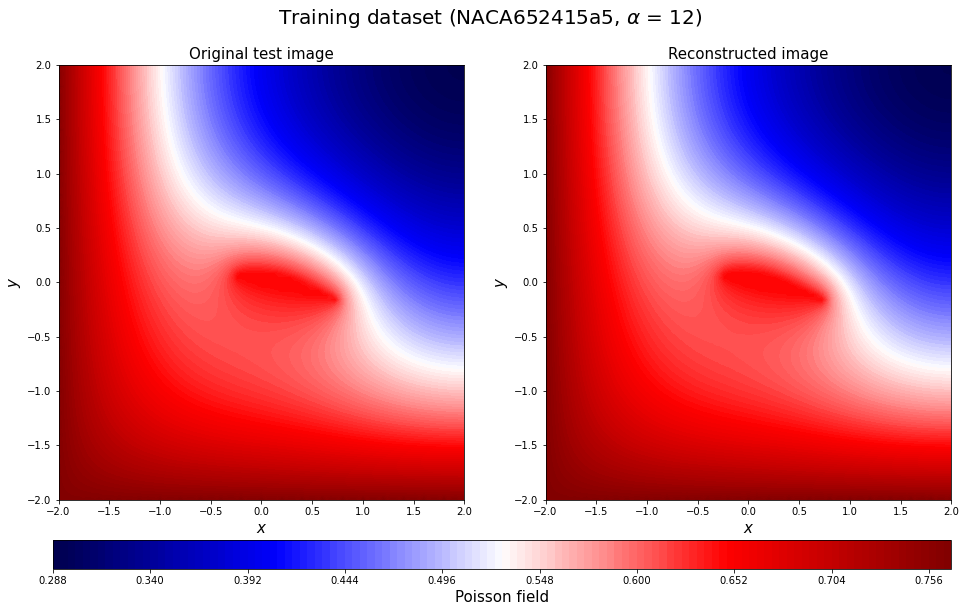

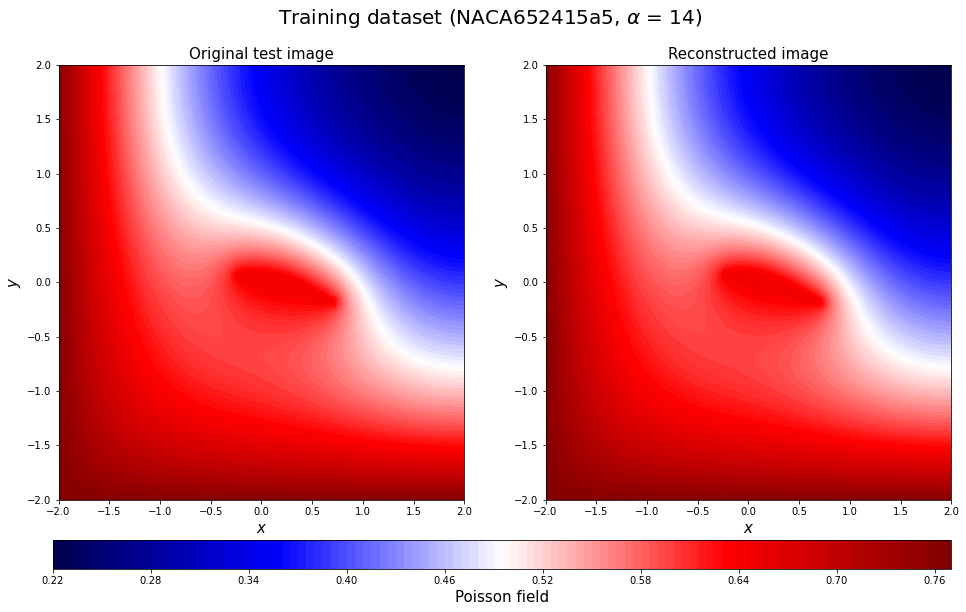

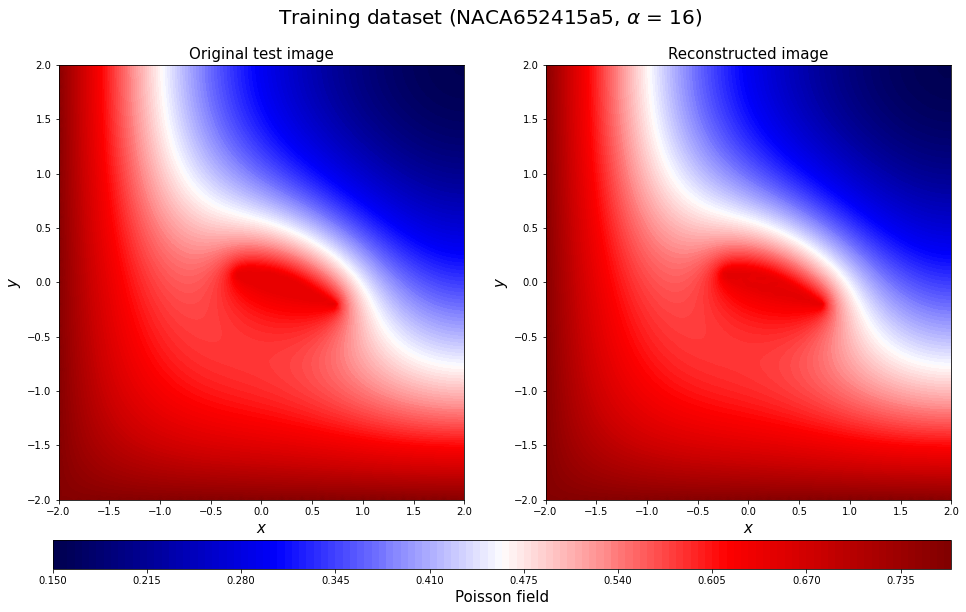

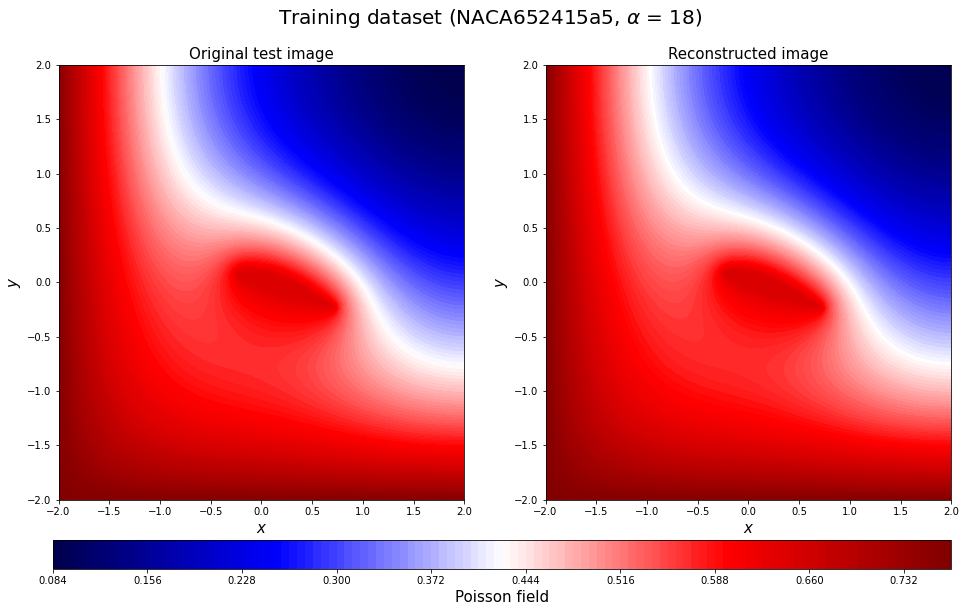

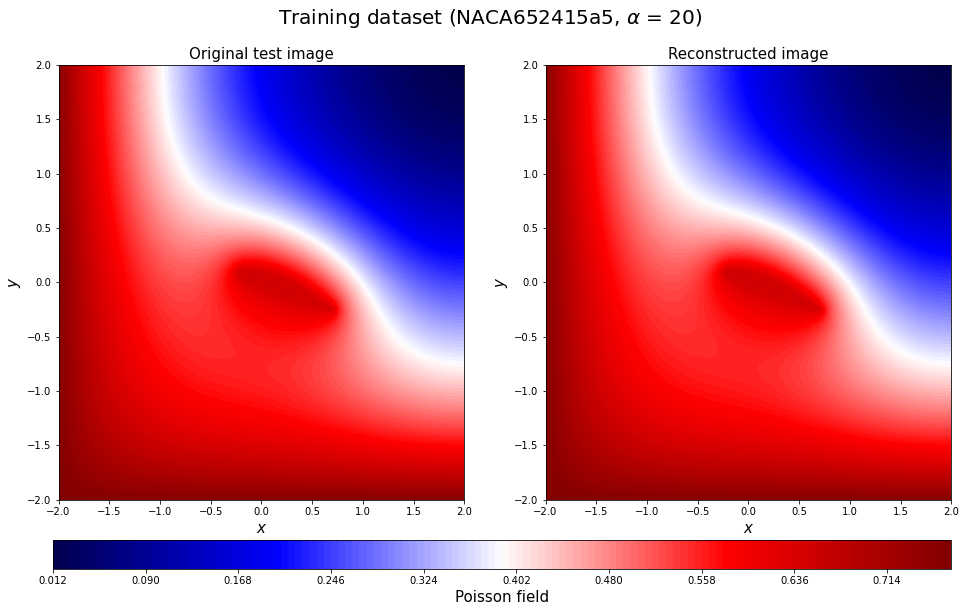

In [63]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

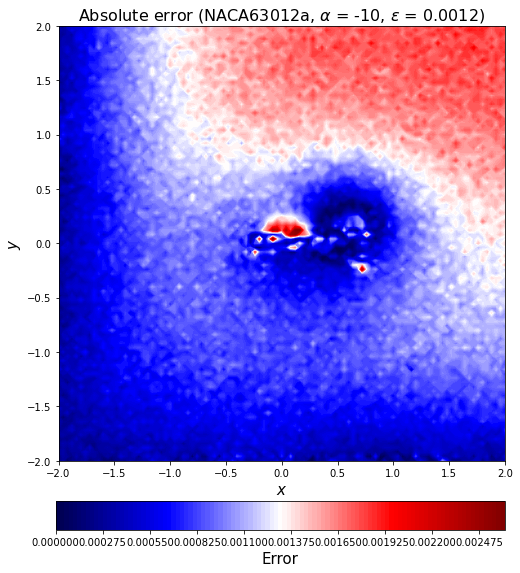

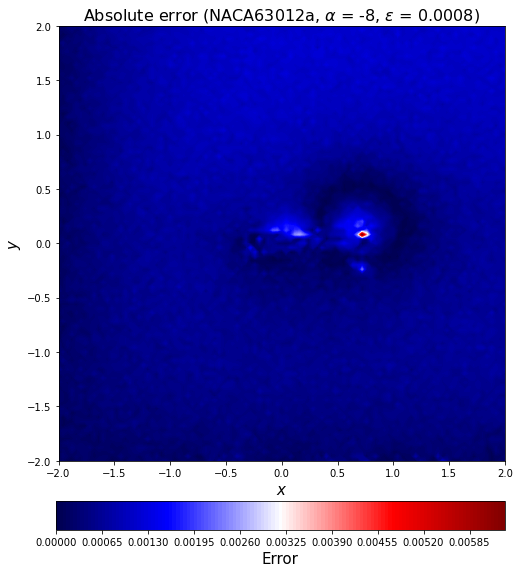

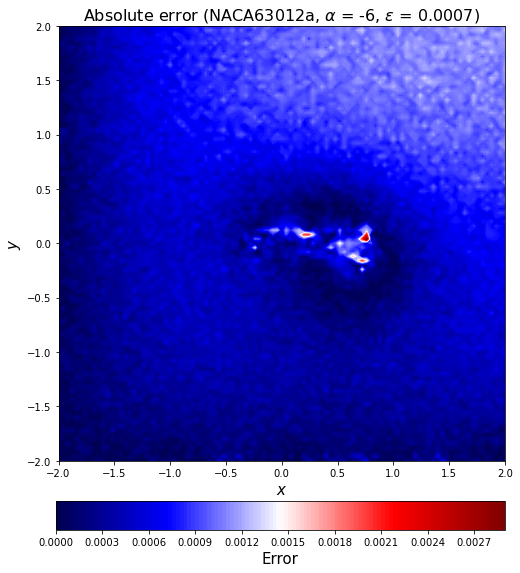

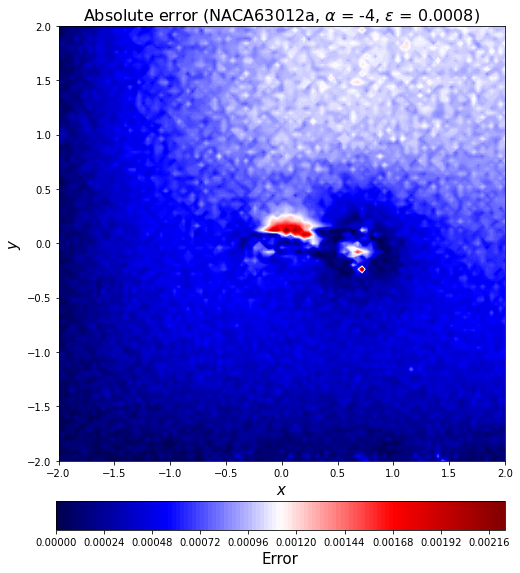

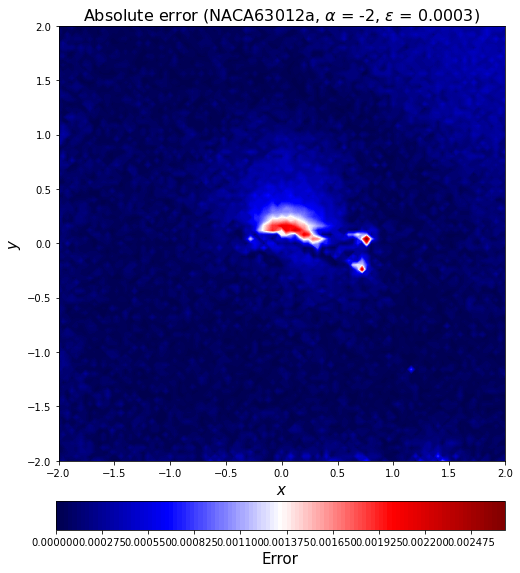

...

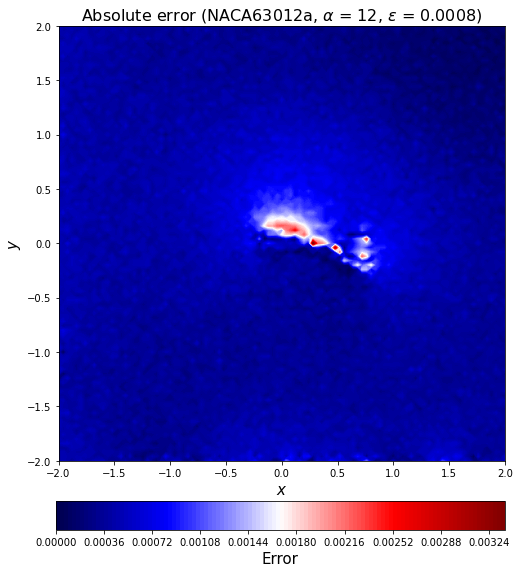

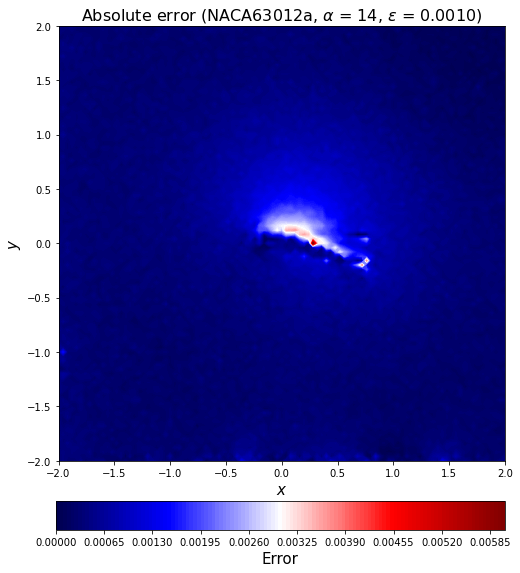

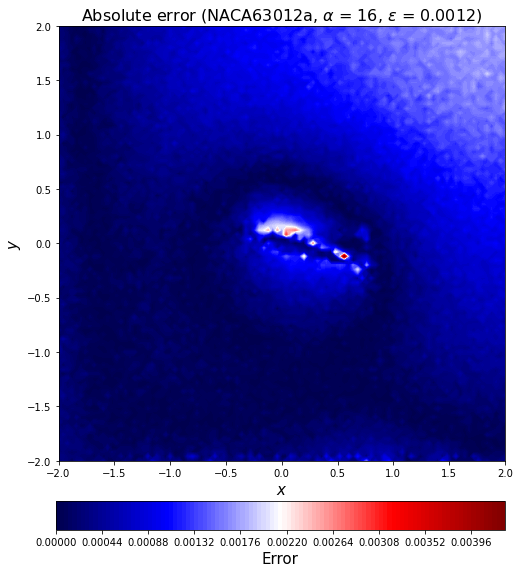

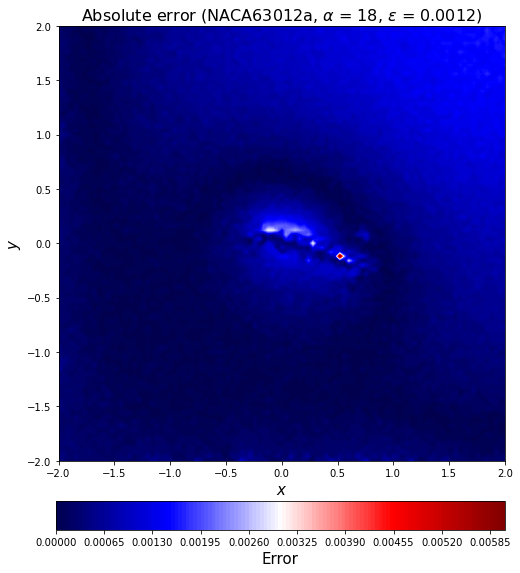

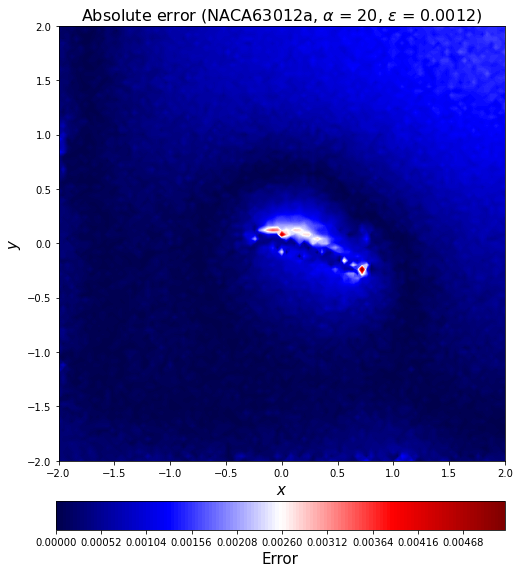

In [64]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

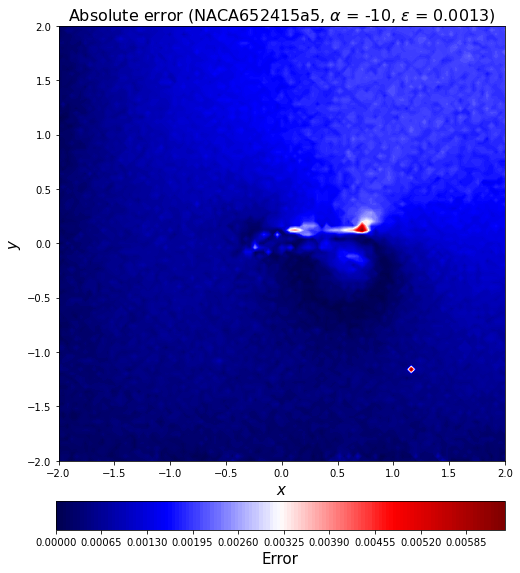

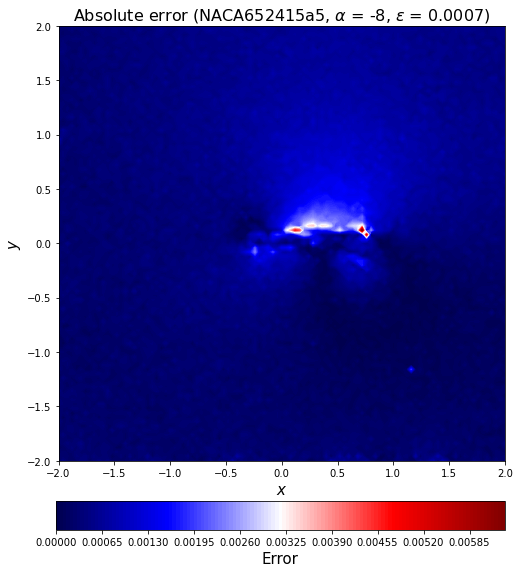

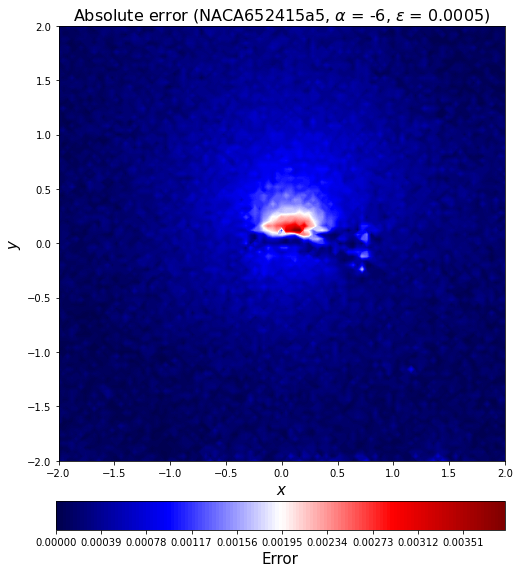

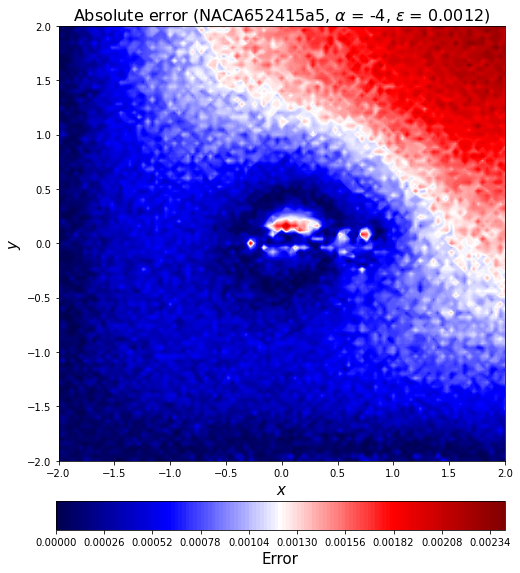

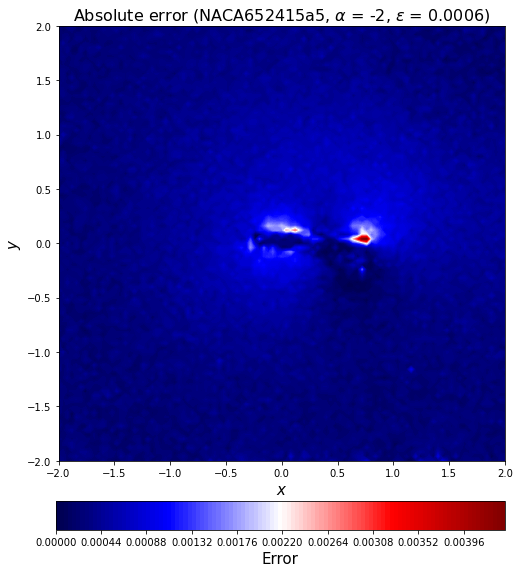

...

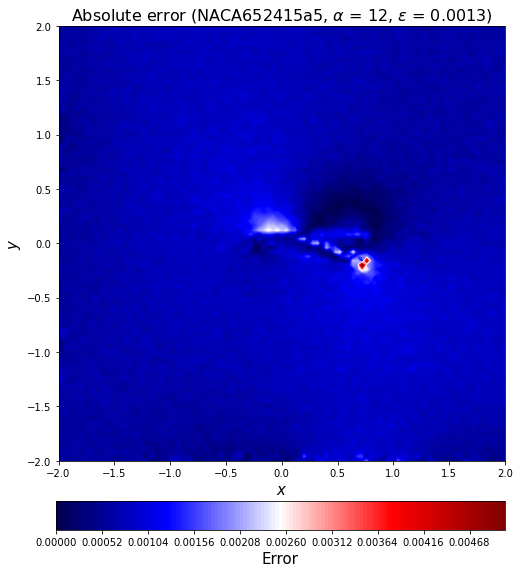

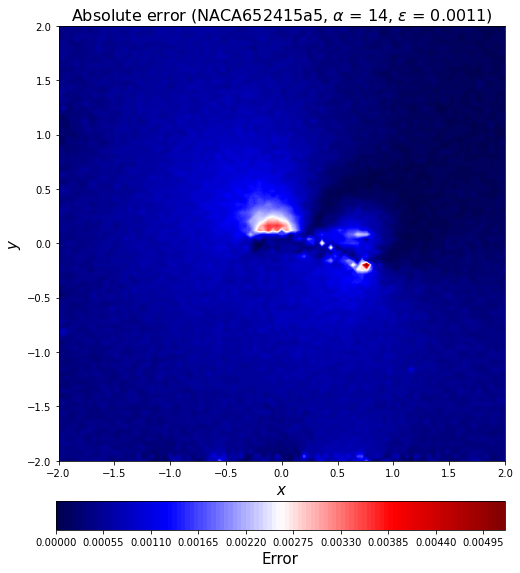

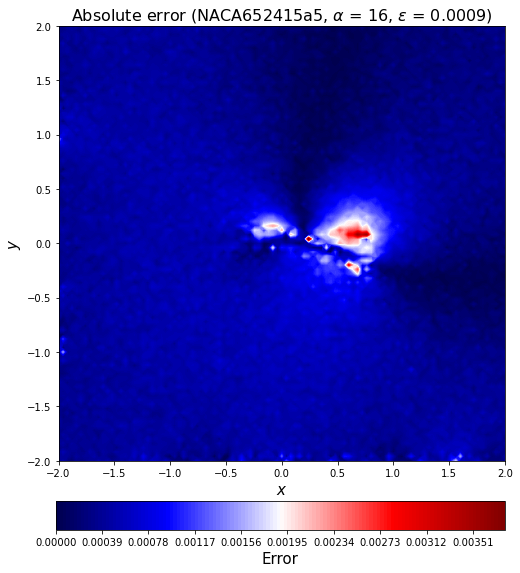

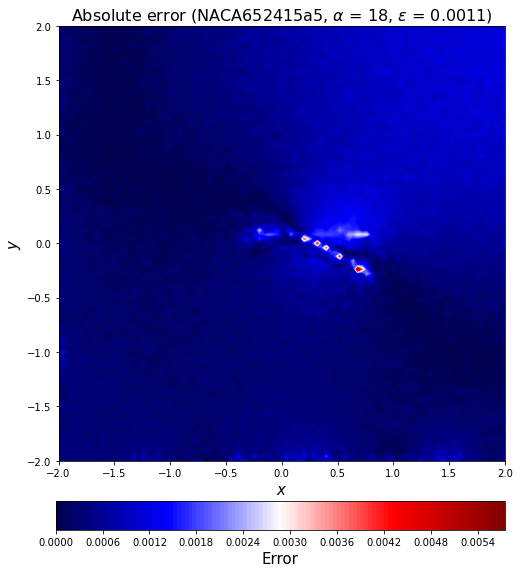

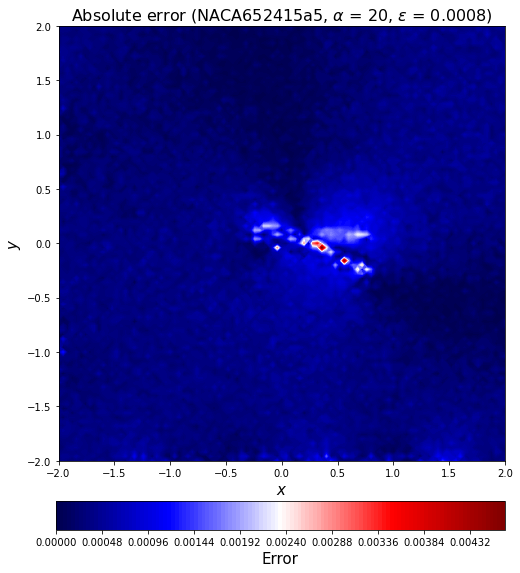

In [65]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[16*20+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

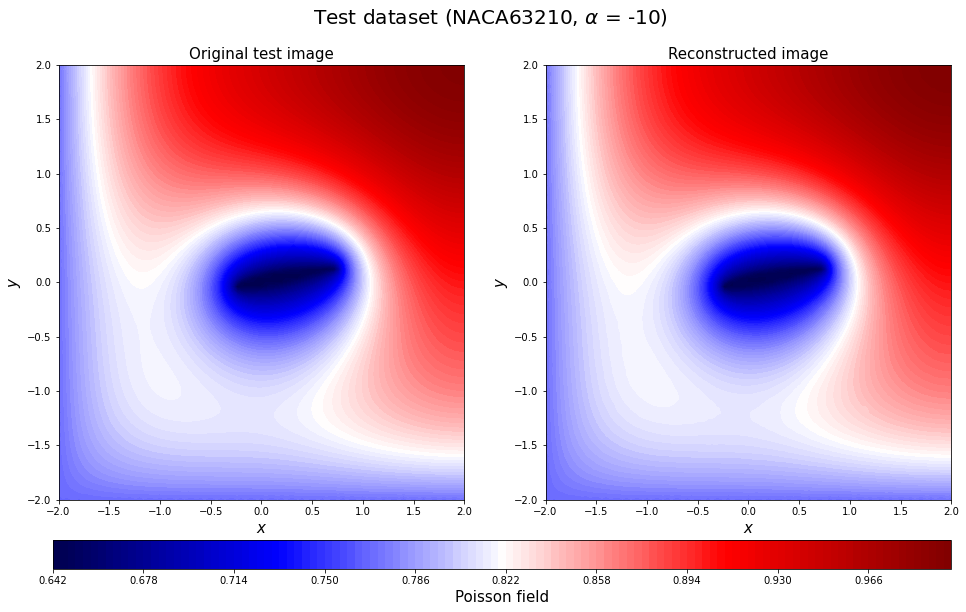

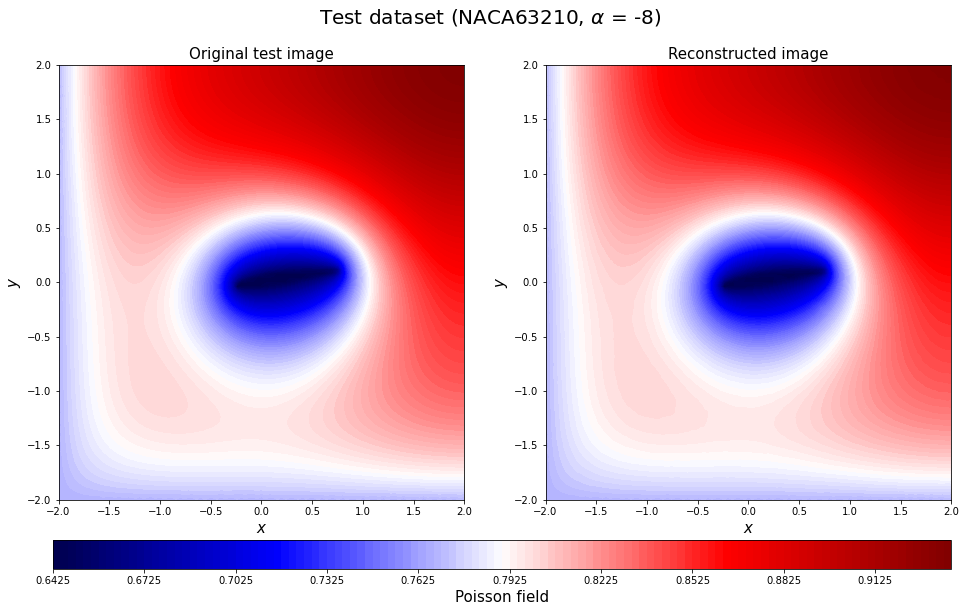

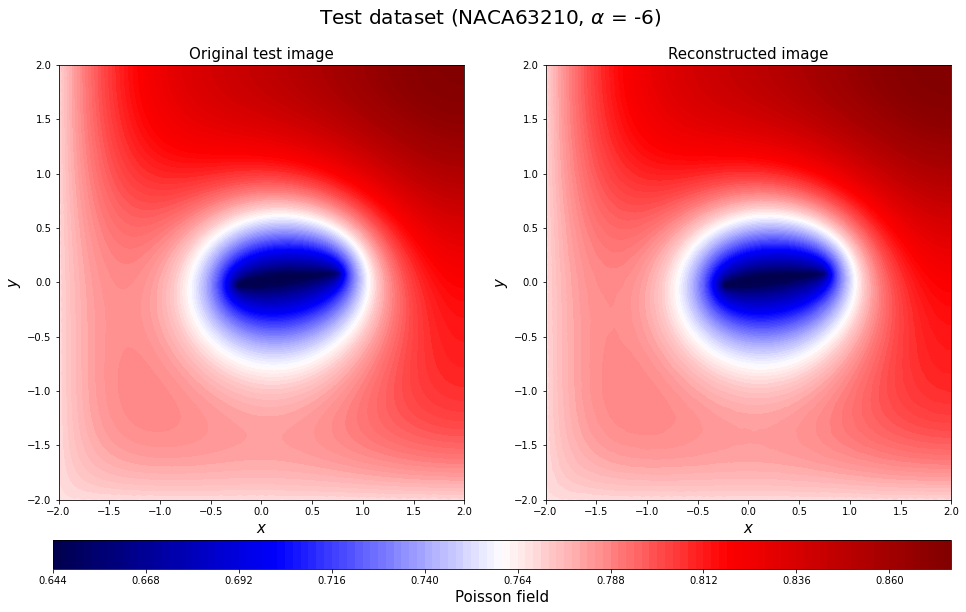

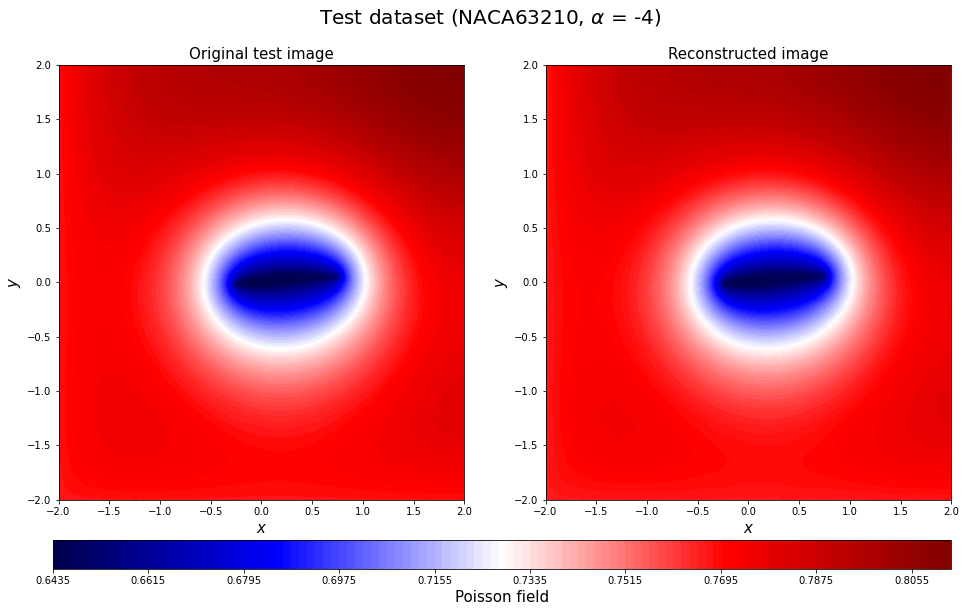

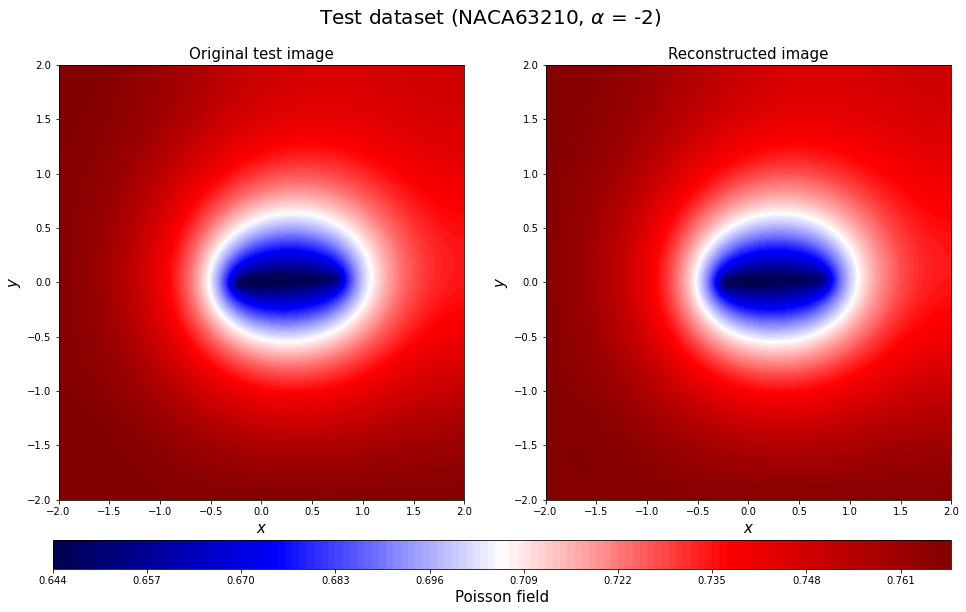

...

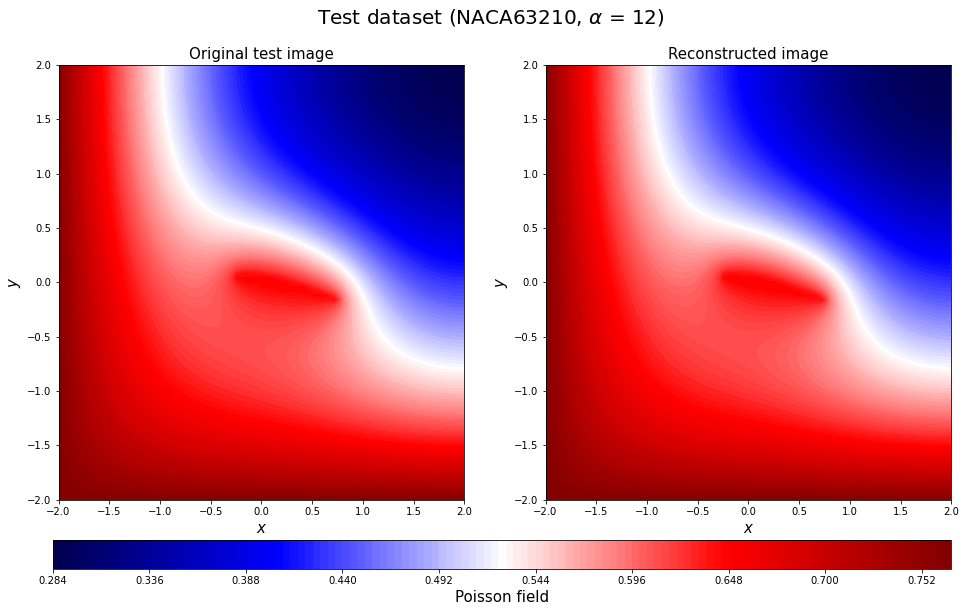

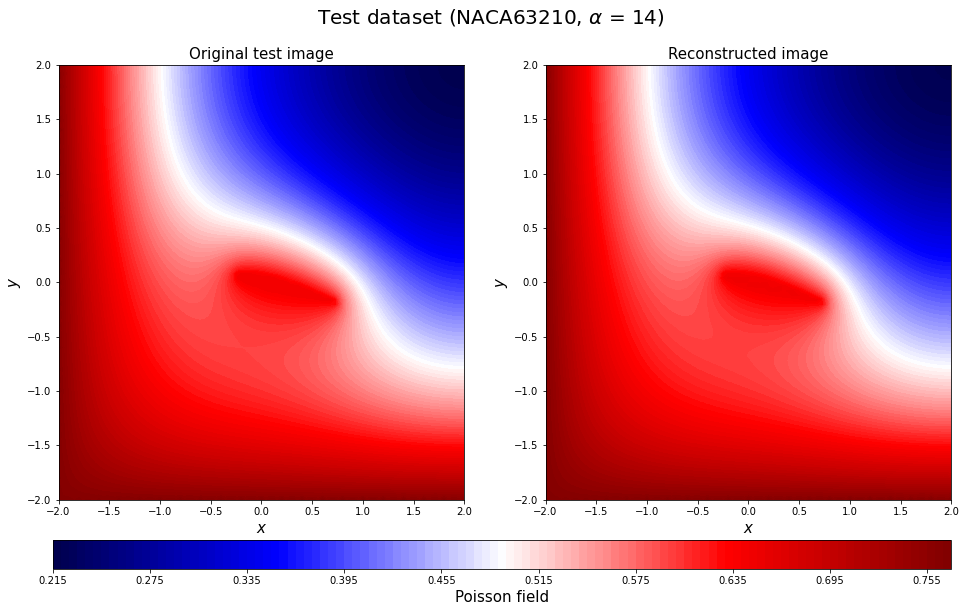

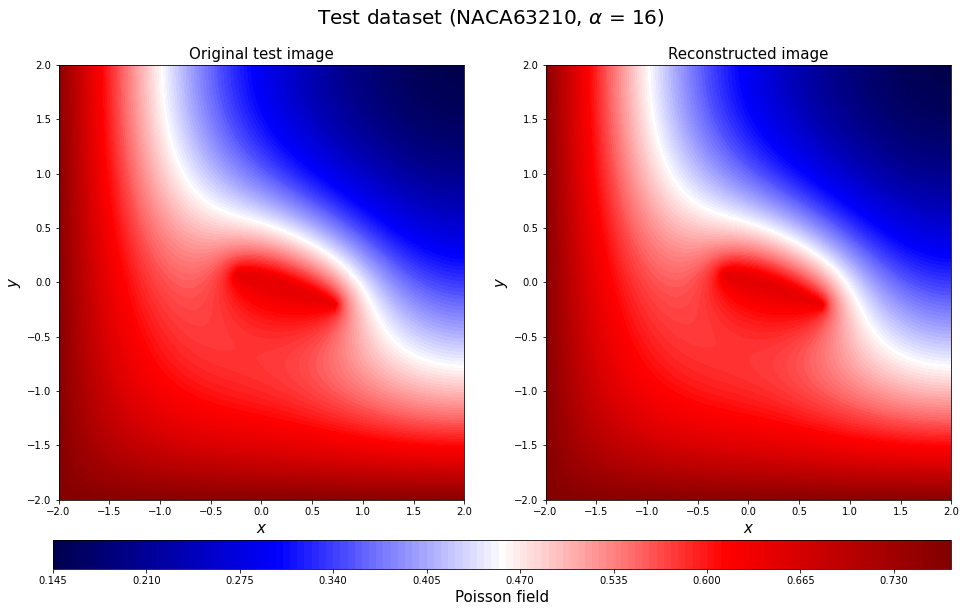

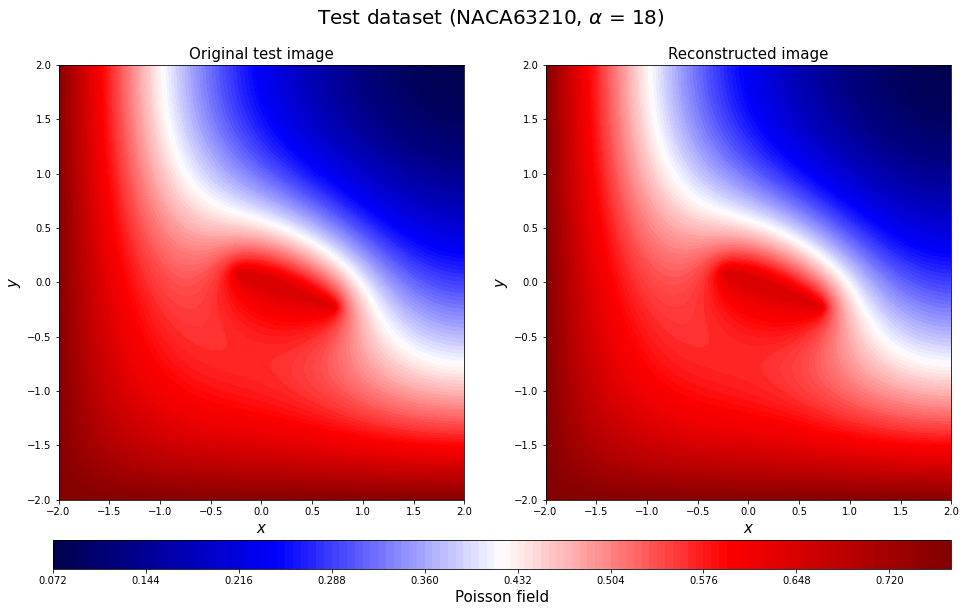

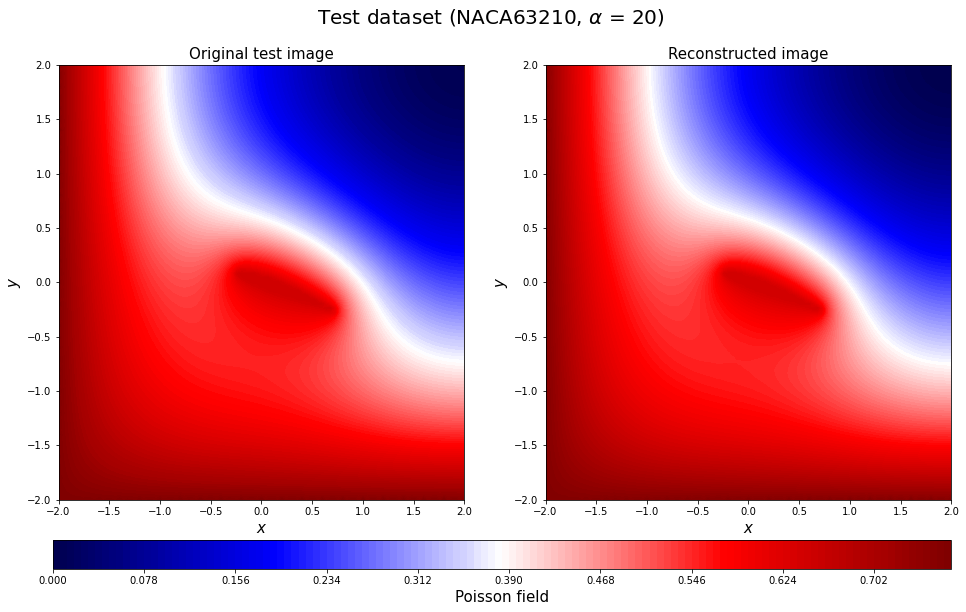

In [66]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

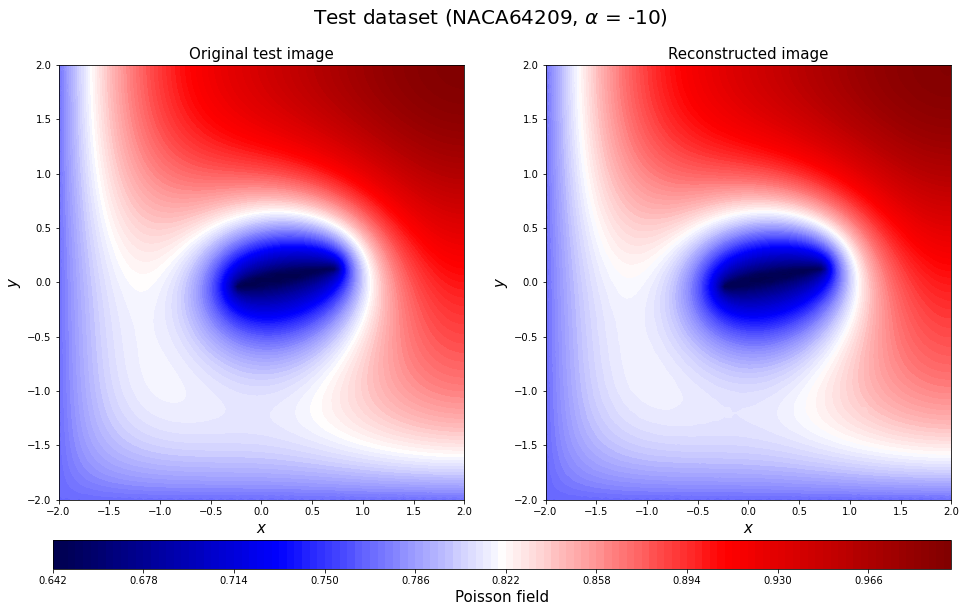

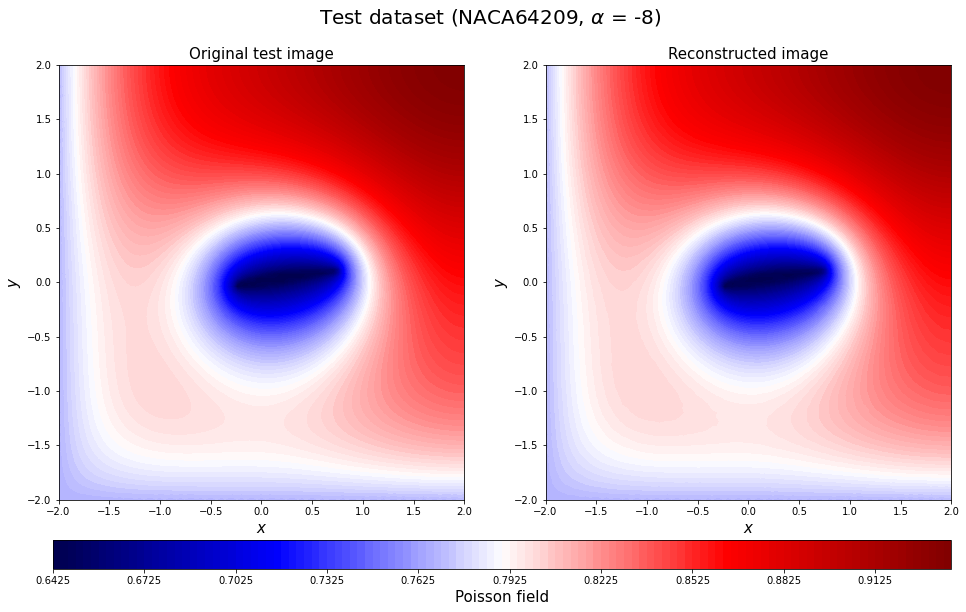

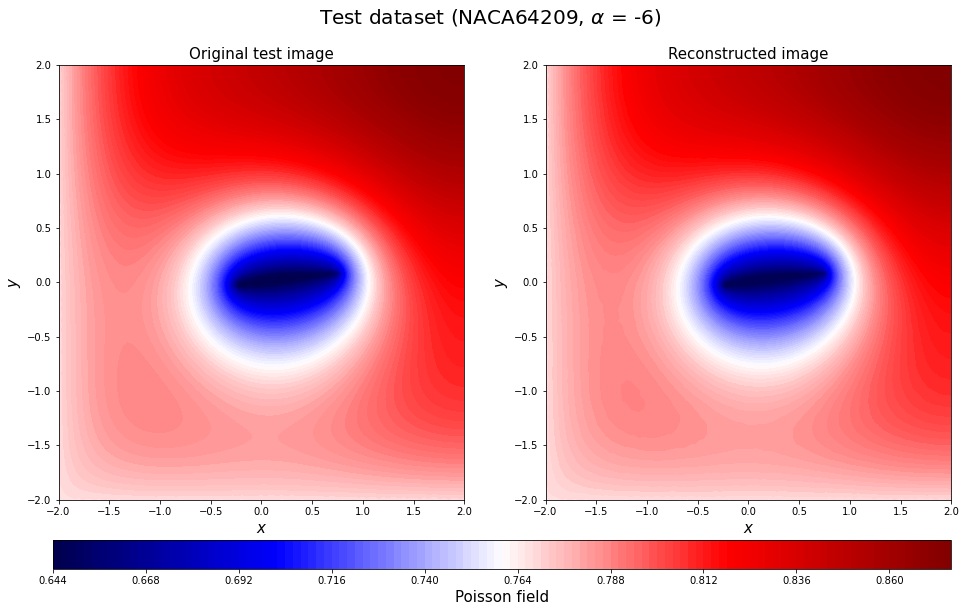

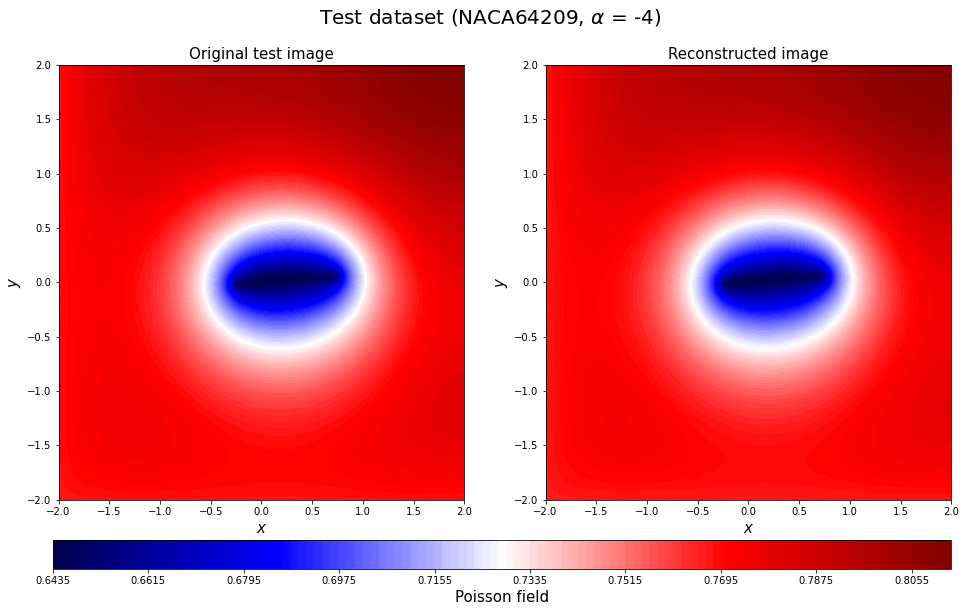

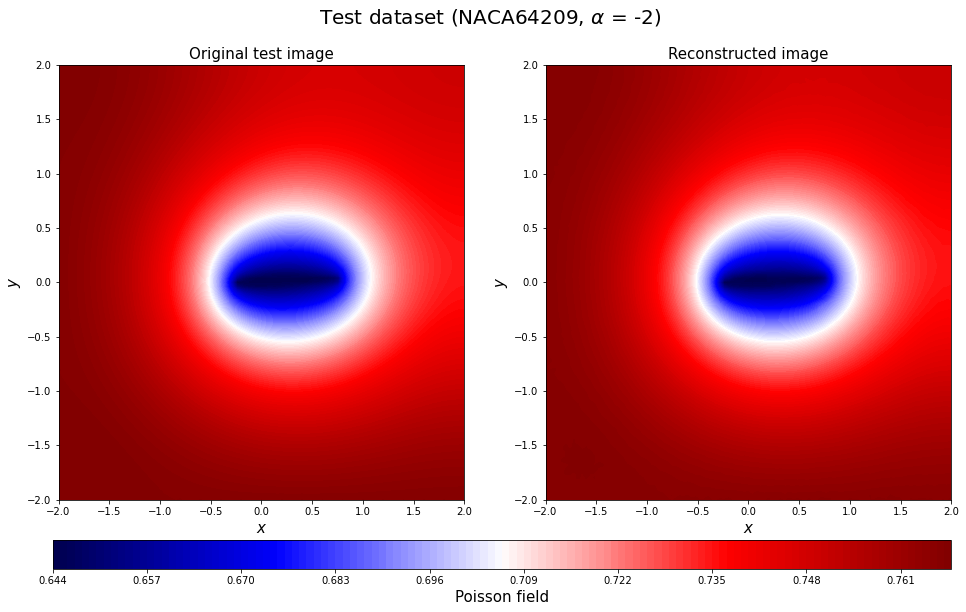

...

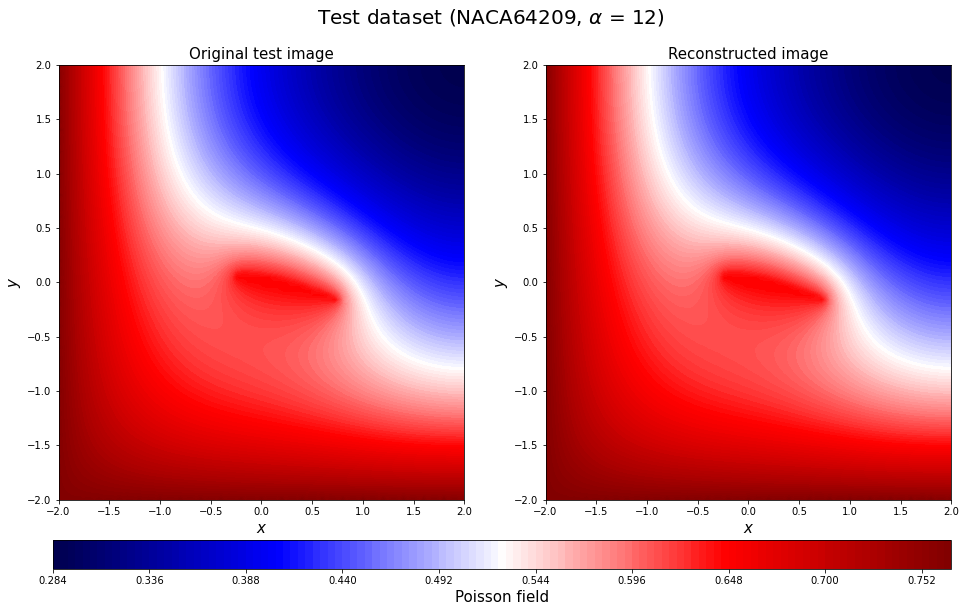

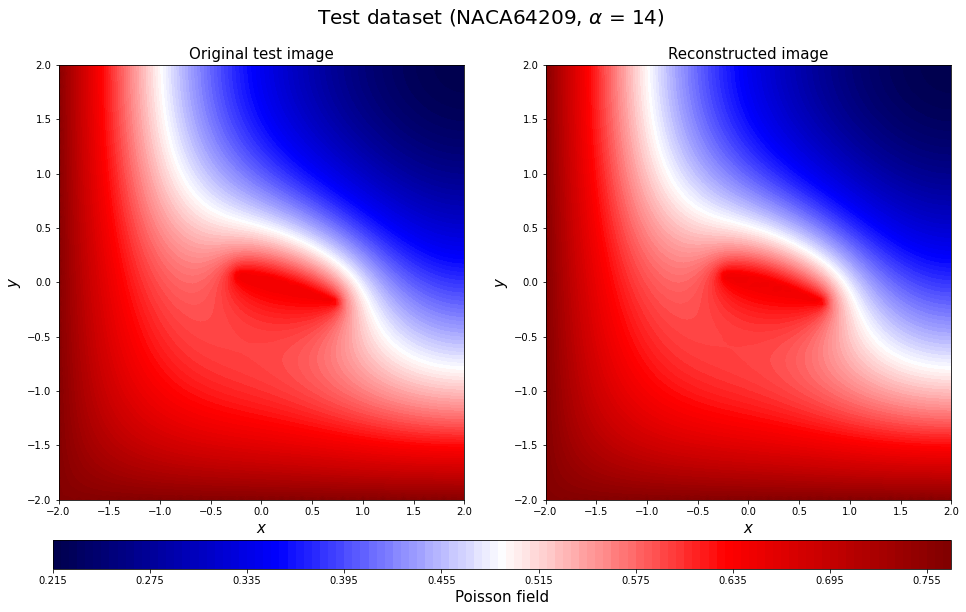

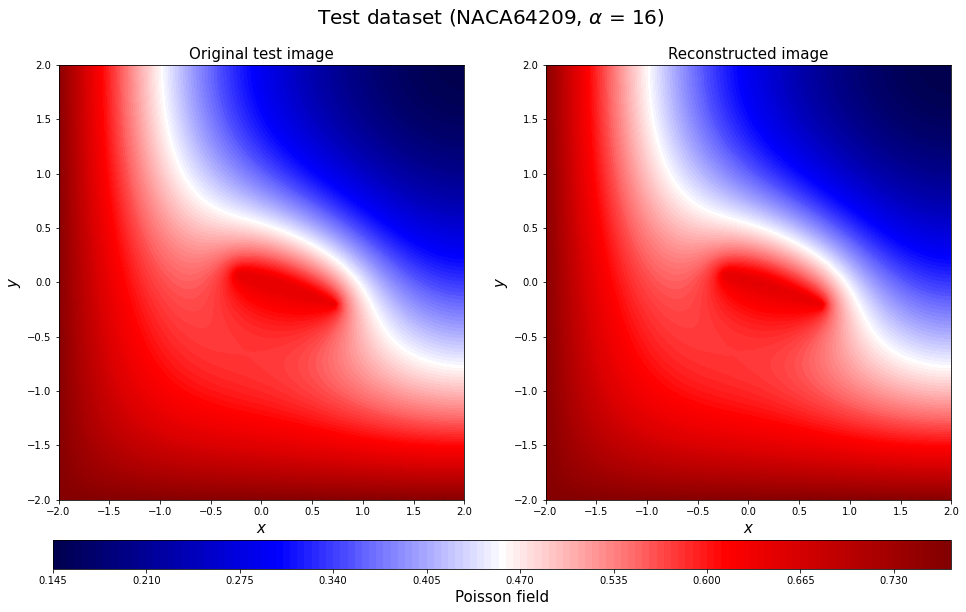

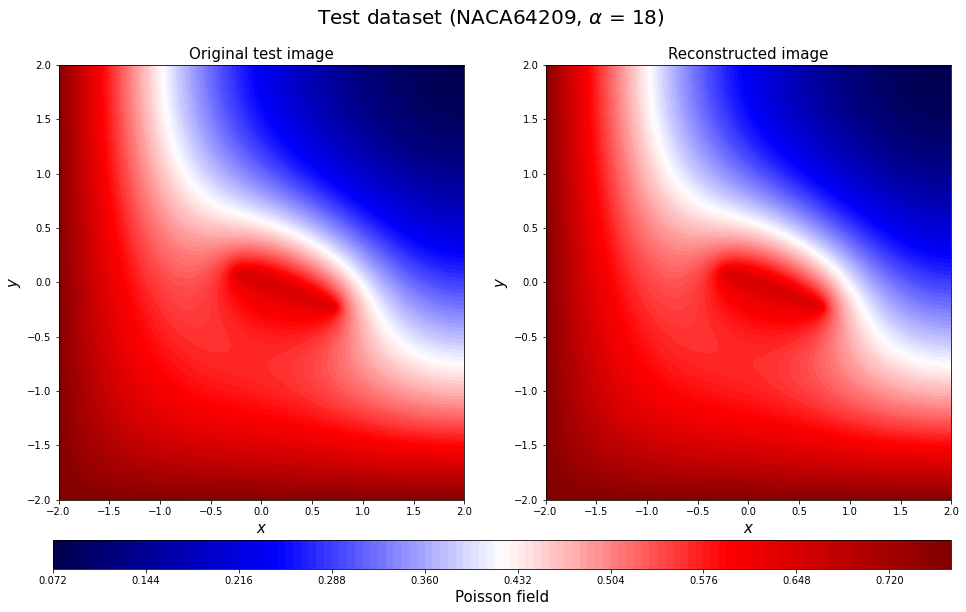

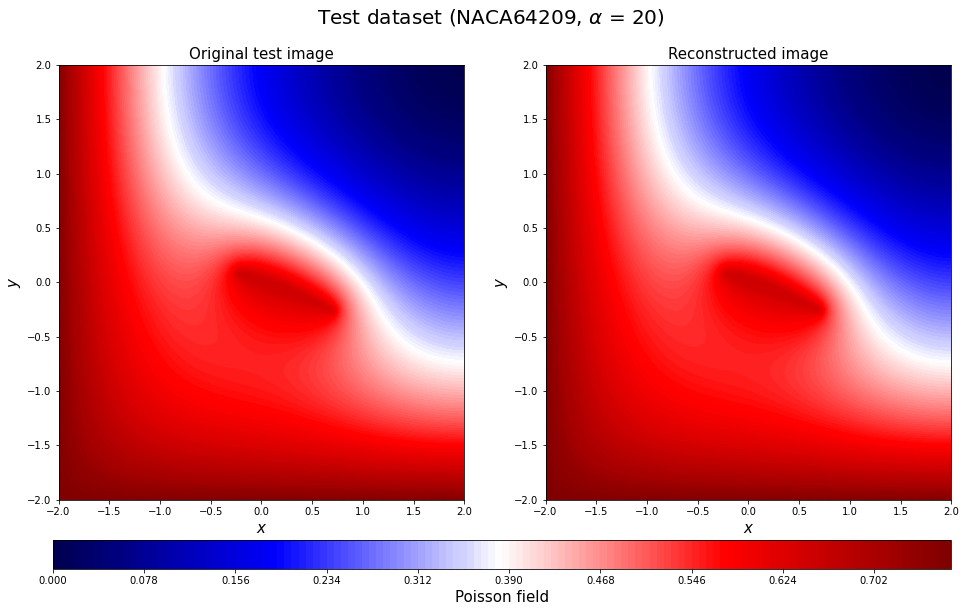

In [67]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

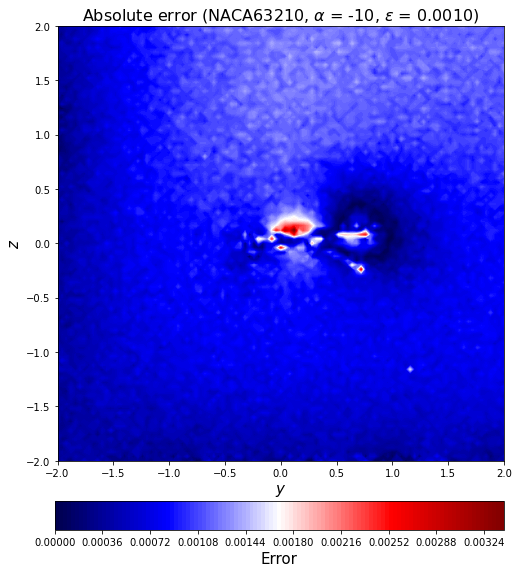

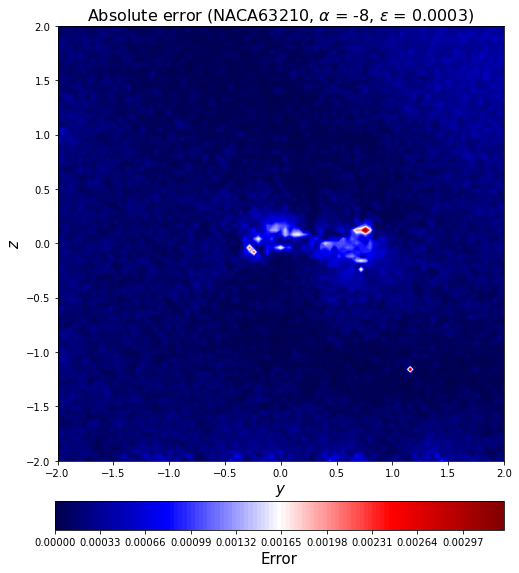

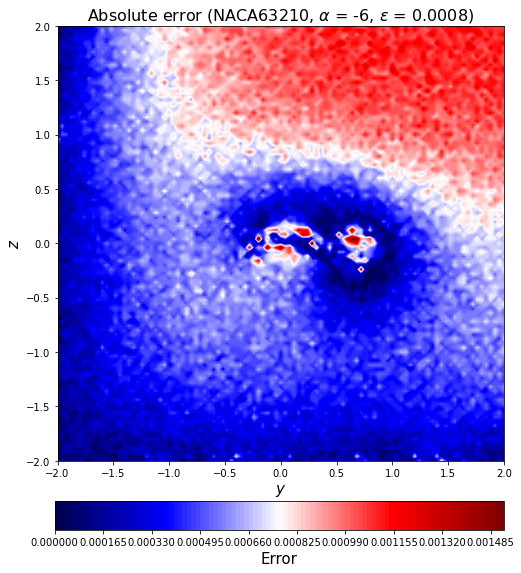

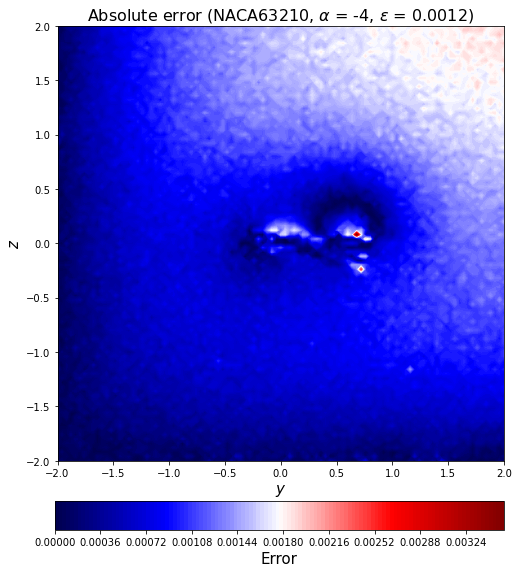

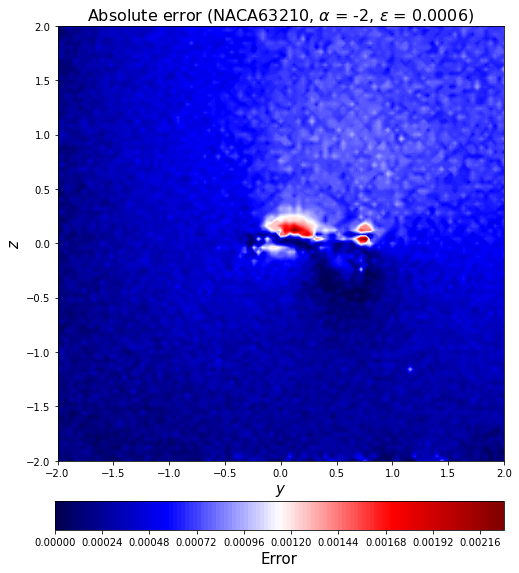

...

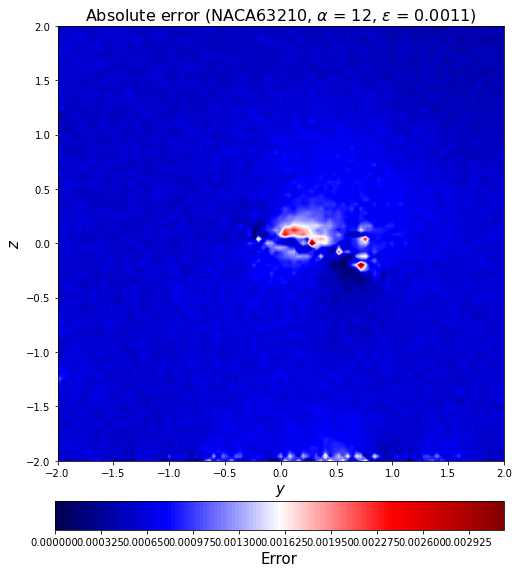

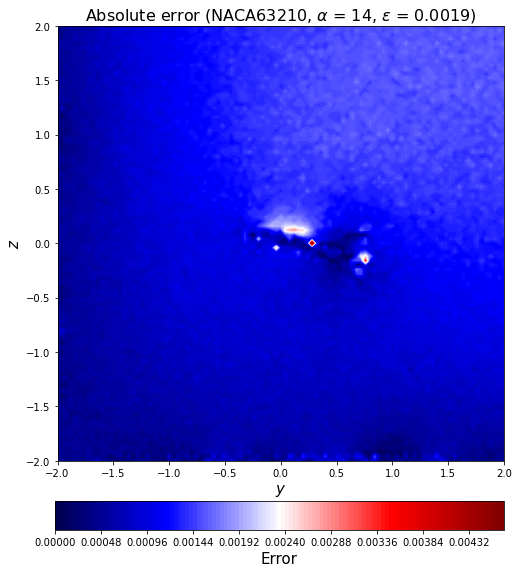

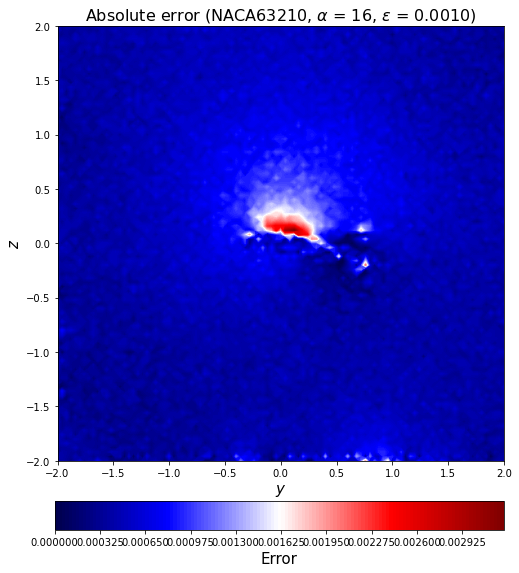

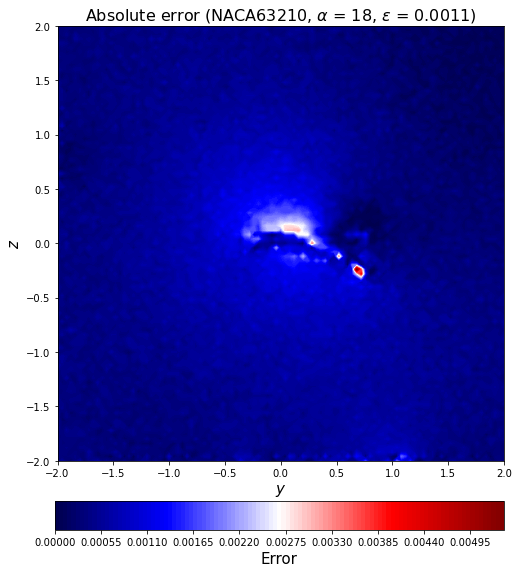

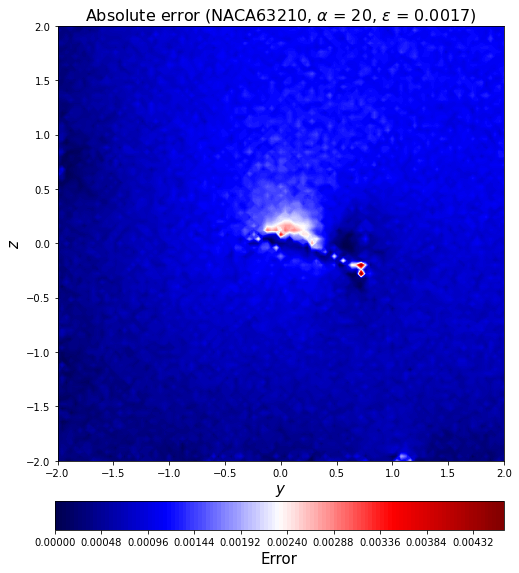

In [68]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

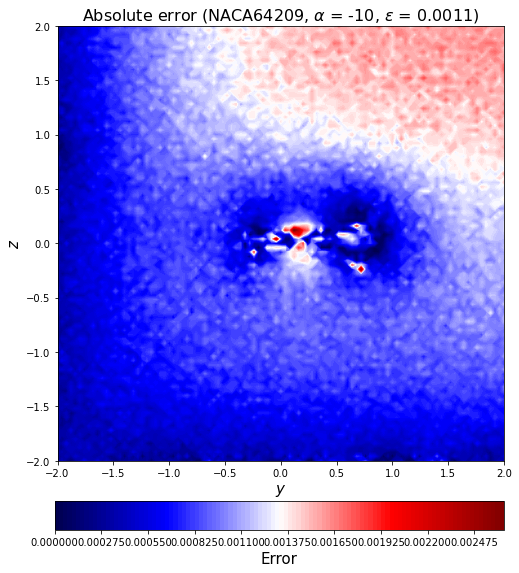

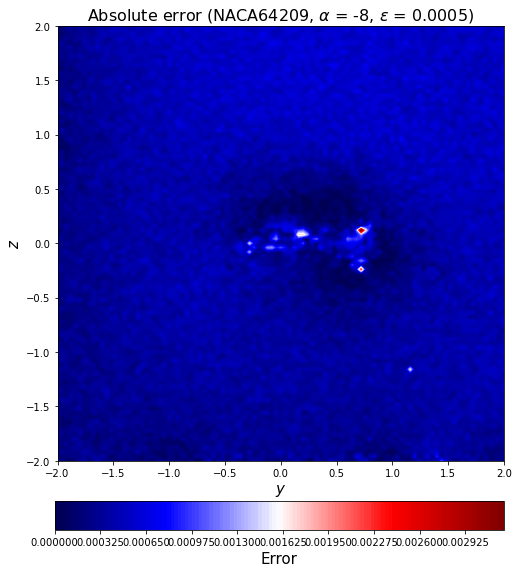

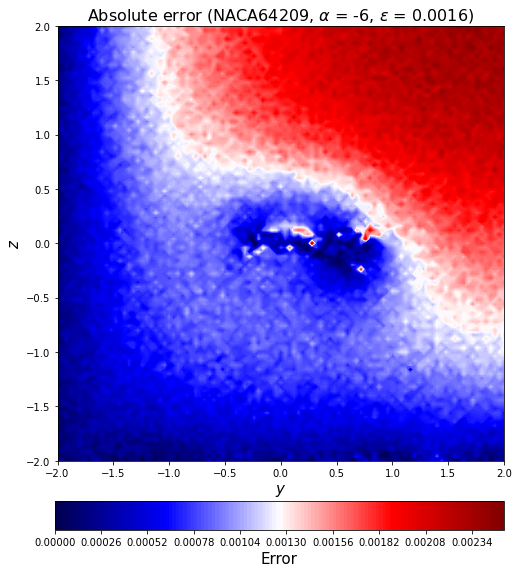

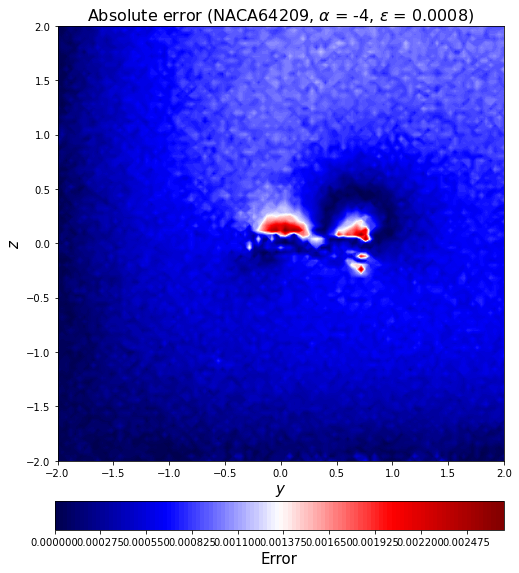

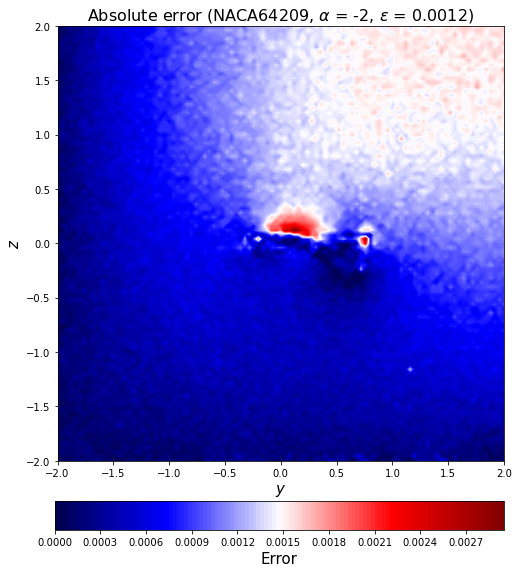

...

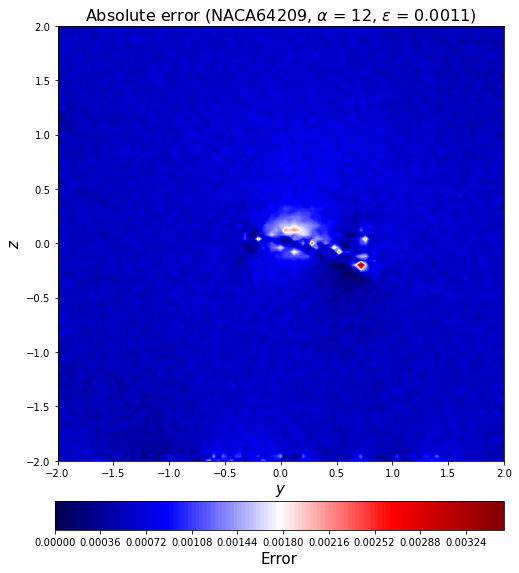

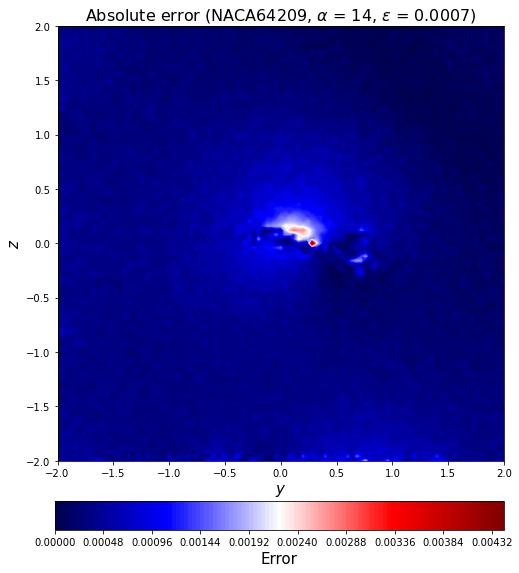

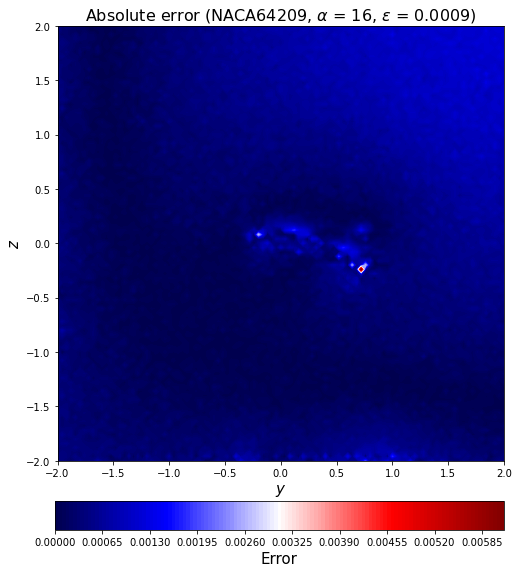

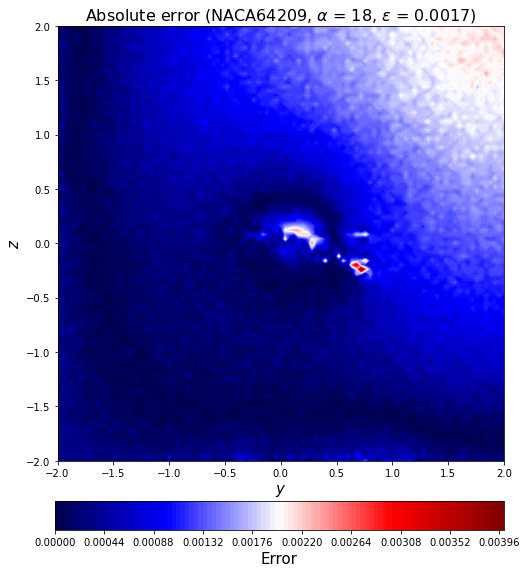

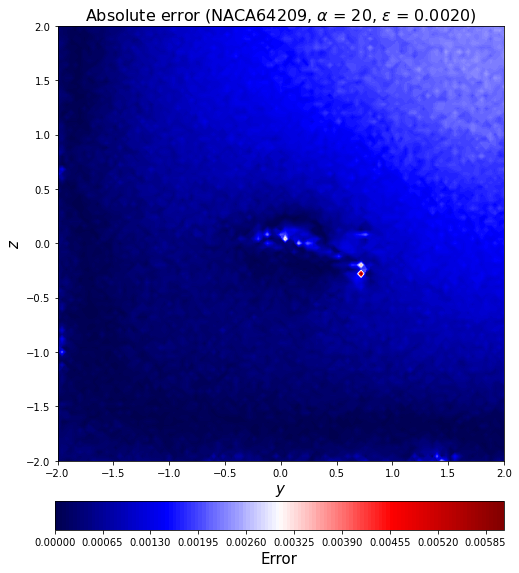

In [69]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [70]:
MAPE_train = (np.sum(np.abs(np.sum(y_train)-np.sum(decoded_train))) / np.abs(np.sum(y_train)))/(y_train.shape[0]/11)*100
acc_train = 1-MAPE_train

In [71]:
MAPE_val = (np.sum(np.abs(np.sum(y_val)-np.sum(decoded_val))) / np.abs(np.sum(y_val)))/(y_val.shape[0]/16)*100
acc_val = 1-MAPE_val

In [72]:
MAPE_test = (np.sum(np.abs(np.sum(y_test)-np.sum(decoded_test))) / np.abs(np.sum(y_test)))/(y_test.shape[0]/11)*100
acc_test = 1-MAPE_test

In [73]:
print(MAPE_train)
print(acc_train)

0.000530256453927539
0.9994697435460724


In [74]:
print(MAPE_val)
print(acc_val)

0.010646530939364632
0.9893534690606354


In [75]:
print(MAPE_test)
print(acc_test)

0.02160204310959763
0.9783979568904023


In [76]:
MAPE_train_list = []
acc_train_list = []
for i in range(0, len(aa_train)):
    MAPE_train_data = (np.sum(np.abs(y_train[i]-decoded_train[i])) / np.sum(np.abs(y_train[i])))/(y_train.shape[0]/11)*100
    MAPE_train_list.append(MAPE_train_data)
    acc_train_data = 1 - MAPE_train_data
    acc_train_list.append(acc_train_data)
print(MAPE_train_list)
print(acc_train_list)

[0.0007331404659798273, 0.0004820130609114718, 0.0003947215081146762, 0.00044115848814835516, 0.00010855554145913581, 0.0003561445211428381, 0.00045818980772489257, 0.0001968039595433413, 0.0003893820895938862, 0.00046294750242875725, 0.0009201142919863466, 0.0004592348489106563, 0.0005036774015655008, 0.0005849399619519485, 0.000557378554212048, 0.0005876300634423686, 0.0008679950544321129, 0.0010459208023705622, 0.0004873397420547661, 0.00020268159038926685, 0.0002737817992734078, 0.00020303776802240816, 0.0002753492606193532, 0.00019893320741769135, 0.0003690861014968489, 0.0006858250178983511, 0.0010250267447000755, 0.0006999615696656194, 0.0007547121993848319, 0.00033588509646902126, 0.0005909687315473263, 0.0004128701739987701, 0.0003044168422484846, 0.0004200642330548228, 9.044948508658695e-05, 0.00010780519434371136, 0.00013369806537625825, 0.0007652340389212521, 0.0003924338555693175, 0.0008334079409662664, 0.0005994938386944568, 0.0005335604836940328, 0.0011034969093829422, 0

In [77]:
MAPE_val_list = []
acc_val_list = []
for i in range(0, len(aa_val)):
    MAPE_val_data = (np.sum(np.abs(y_val[i]-decoded_val[i])) / np.sum(np.abs(y_val[i])))/(y_val.shape[0]/16)*100
    MAPE_val_list.append(MAPE_val_data)
    acc_val_data = 1 - MAPE_val_data
    acc_val_list.append(acc_val_data)
print(MAPE_val_list)
print(acc_val_list)

[0.005632226307425049, 0.017846356681688626, 0.006210706672855807, 0.016184114711126, 0.002239902286245035, 0.011217445177444444, 0.007629112380723361, 0.012836086519541181, 0.005710357646353961, 0.00542915218101801, 0.008847476419386994, 0.005425787630077729, 0.004565761473791649, 0.011856348731430747, 0.021791695972359398, 0.015109640771588271, 0.0036939255998818415, 0.002665192163635117, 0.017060492393843964, 0.004759590075441214, 0.008514700757188185, 0.002227267717790868, 0.0036611237063092247, 0.003948096050401175, 0.006142271408169805, 0.012670820749043226, 0.009158014577702437, 0.01640799079706169, 0.008814364238856303, 0.012835015503773466, 0.007952826284708133, 0.013419606127313112, 0.03905683077472956, 0.01577027286620606, 0.04151382201429598, 0.0032747175181221887, 0.032532984262407964, 0.027142858523634756, 0.04311155419003401, 0.01506661170660651, 0.030770978958253124, 0.01845685709587255, 0.005182719233643045, 0.018512837328137008, 0.018143439375067027, 0.034320588241506

In [78]:
MAPE_test_list = []
acc_test_list = []
for i in range(0, len(aa_test)):
    MAPE_test_data = (np.sum(np.abs(y_test[i]-decoded_test[i])) / np.sum(np.abs(y_test[i])))/(y_test.shape[0]/11)*100
    MAPE_test_list.append(MAPE_test_data)
    acc_test_data = 1 - MAPE_test_data
    acc_test_list.append(acc_test_data)
print(MAPE_test_list)
print(acc_test_list)

[0.005116343942917662, 0.0022774864496543598, 0.006616496091334358, 0.003365862661550287, 0.004905122878360895, 0.005237583734339564, 0.003916578333464287, 0.003554951303803946, 0.002341208995117229, 0.0059057961363114956, 0.004482842029448215, 0.0052078303354484235, 0.0030725533332548243, 0.003325741236950617, 0.006388289717671058, 0.008142717864297577, 0.024080781970745757, 0.02038929653200238, 0.017675749871351343, 0.016236471135163202, 0.026632071702347535, 0.02394492261306415, 0.030498803225072507, 0.027012142035618174, 0.014141765801179837, 0.013161297261633642, 0.010982337961517919, 0.04584360286570334, 0.0197361794787169, 0.025047147135088325, 0.0032368879214489704, 0.007071812920987353, 0.004566602189917912, 0.0009581091102156636, 0.003454098570296205, 0.005296363714686731, 0.0027780938287071725, 0.004058555875808963, 0.0031387044509212834, 0.00670412624767695, 0.0028532369365327566, 0.005560623854979125, 0.00406721349816271, 0.0052593391858986515, 0.008818690615137095, 0.0046

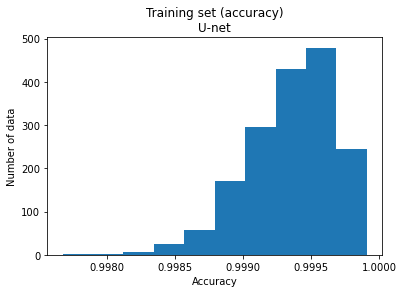

In [79]:
plt.hist(acc_train_list)
plt.title('Training set (accuracy)\nU-net')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

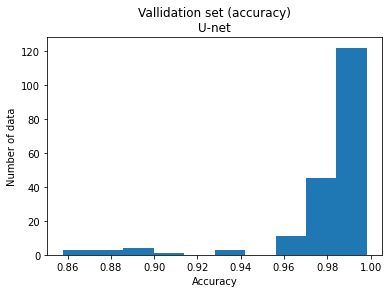

In [90]:
plt.hist(acc_val_list)
plt.title('Vallidation set (accuracy)\nU-net')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

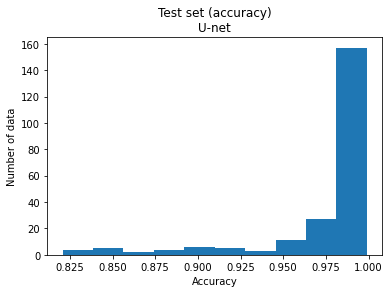

In [80]:
plt.hist(acc_test_list)
plt.title('Test set (accuracy)\nU-net')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

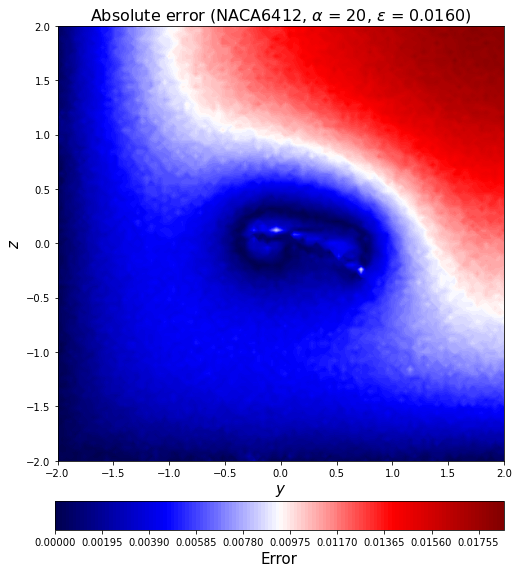

In [81]:
error_test_abs2_rotate = error_test_abs[-1].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-1])[3:-2],
                                                                   aa_test[-1], l2_error_test_list[-1]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-1])[3:-2])+str(aa_test[-1])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

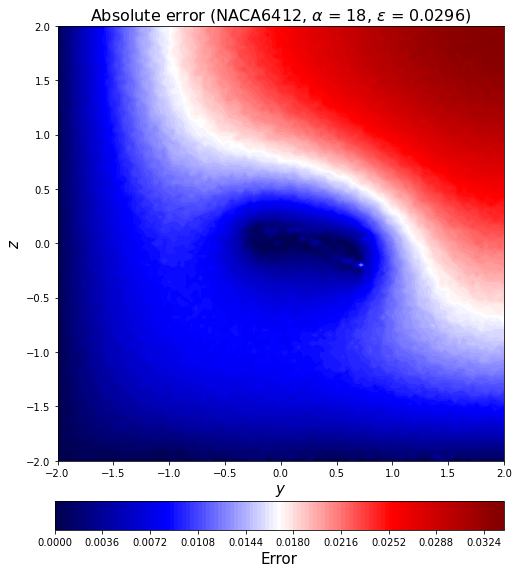

In [82]:
error_test_abs2_rotate = error_test_abs[-2].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-2])[3:-2],
                                                                   aa_test[-2], l2_error_test_list[-2]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-2])[3:-2])+str(aa_test[-2])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

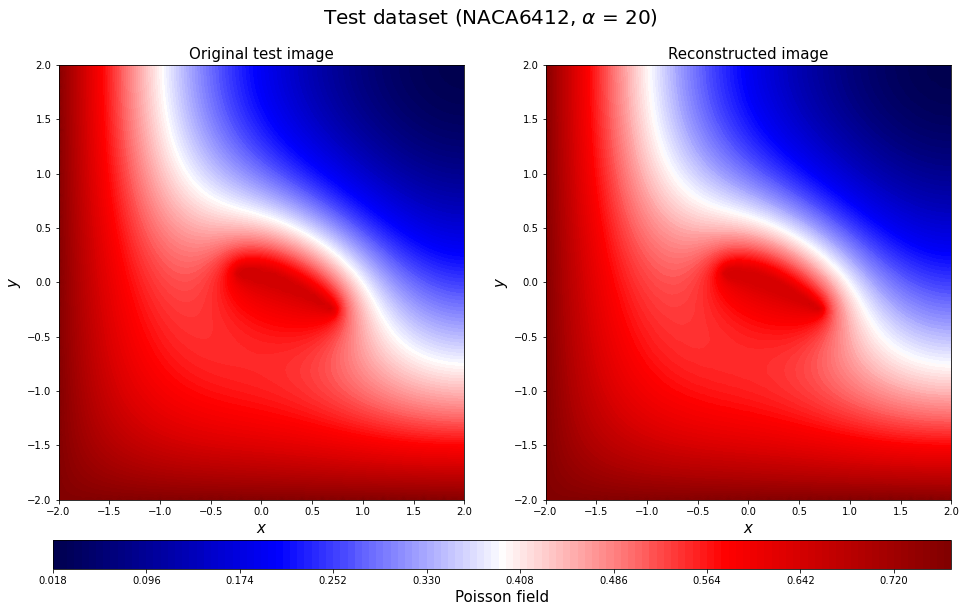

In [83]:
c=-1
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

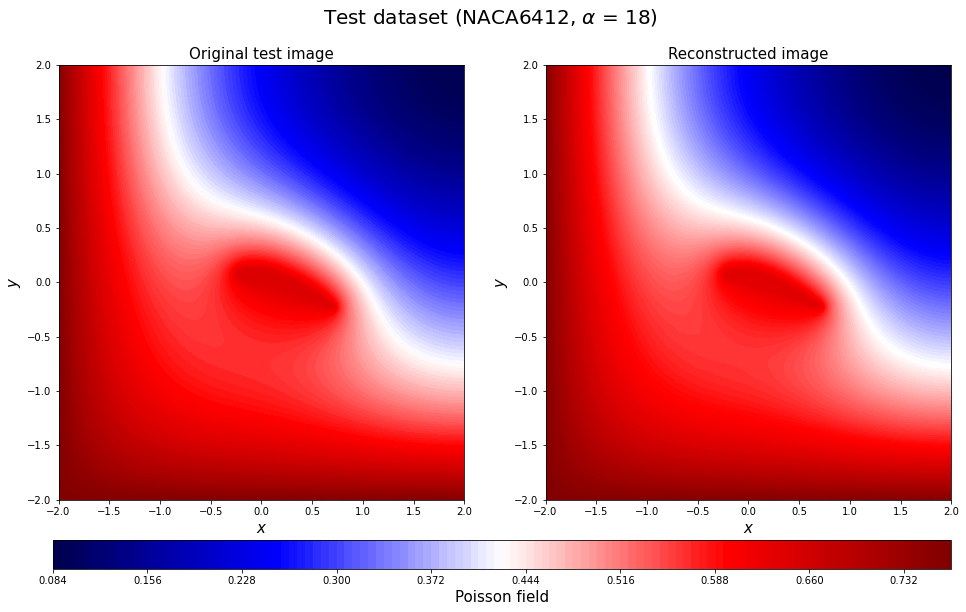

In [84]:
c=-2
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

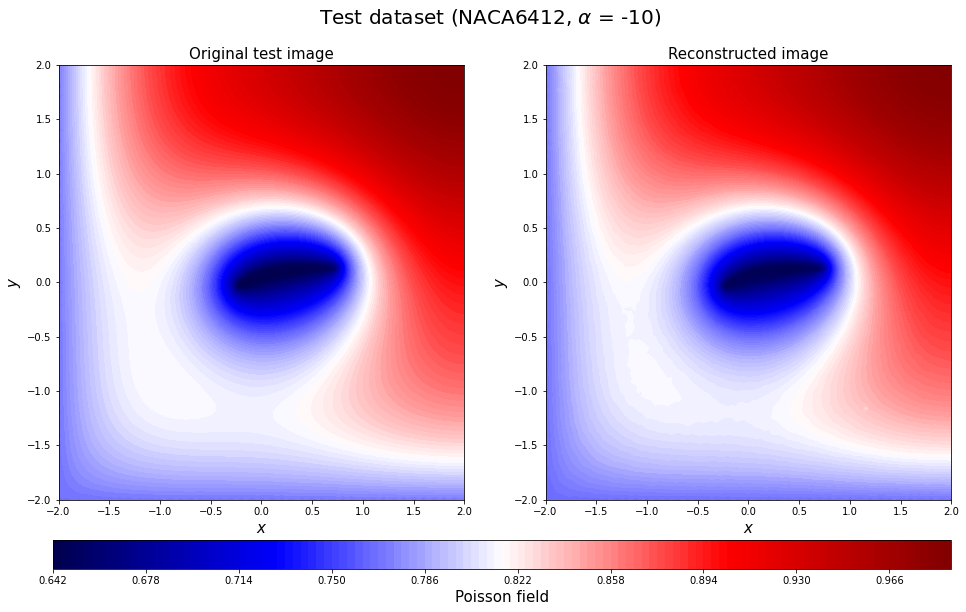

In [85]:
c=-16
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

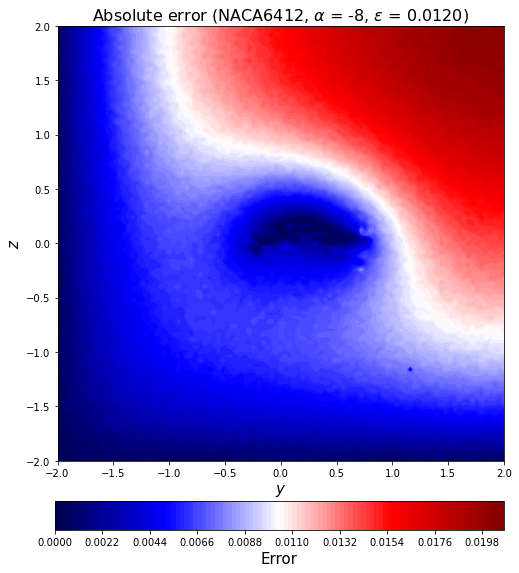

In [86]:
error_test_abs2_rotate = error_test_abs[-15].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-15])[3:-2],
                                                                   aa_test[-15], l2_error_test_list[-15]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-15])[3:-2])+str(aa_test[-15])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

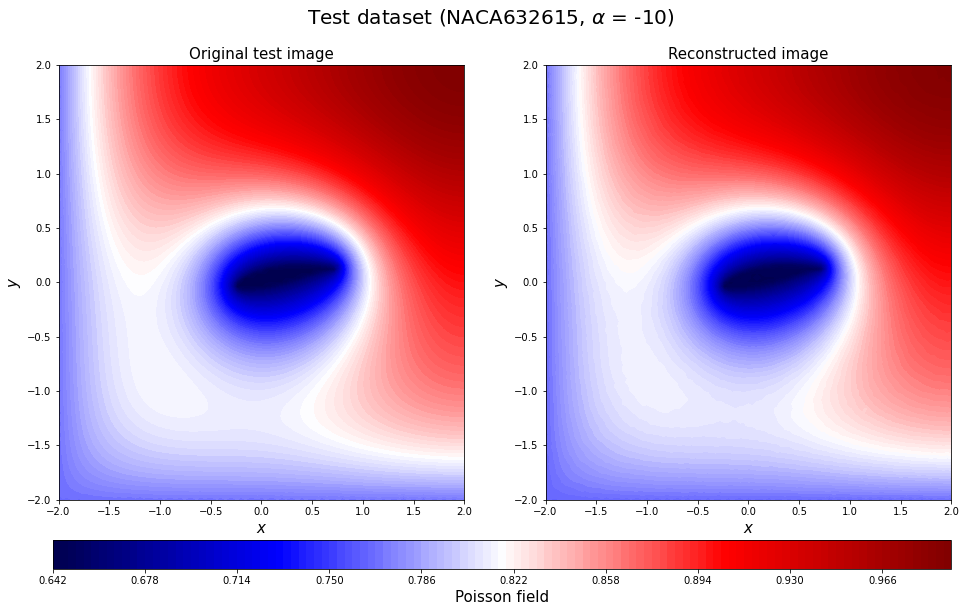

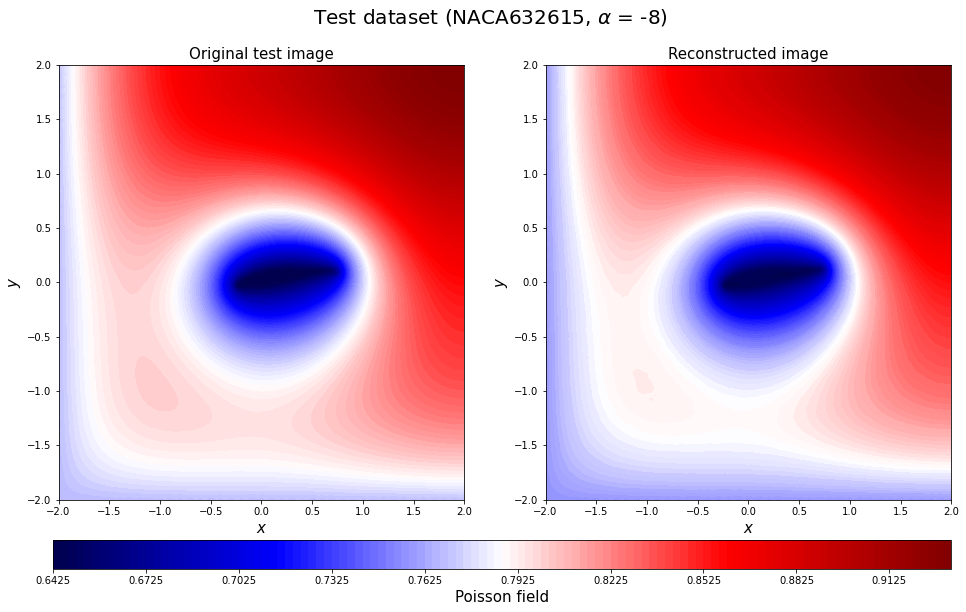

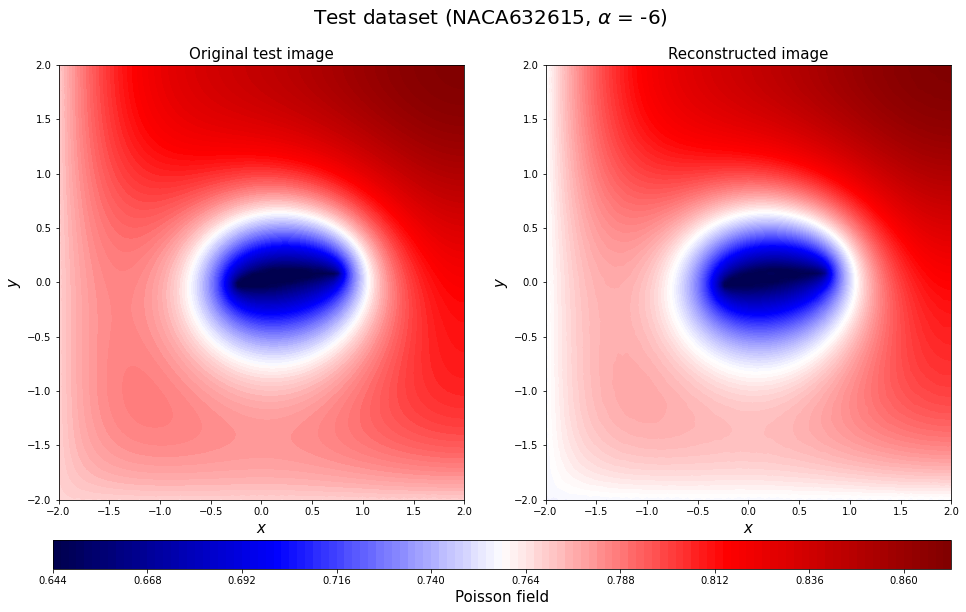

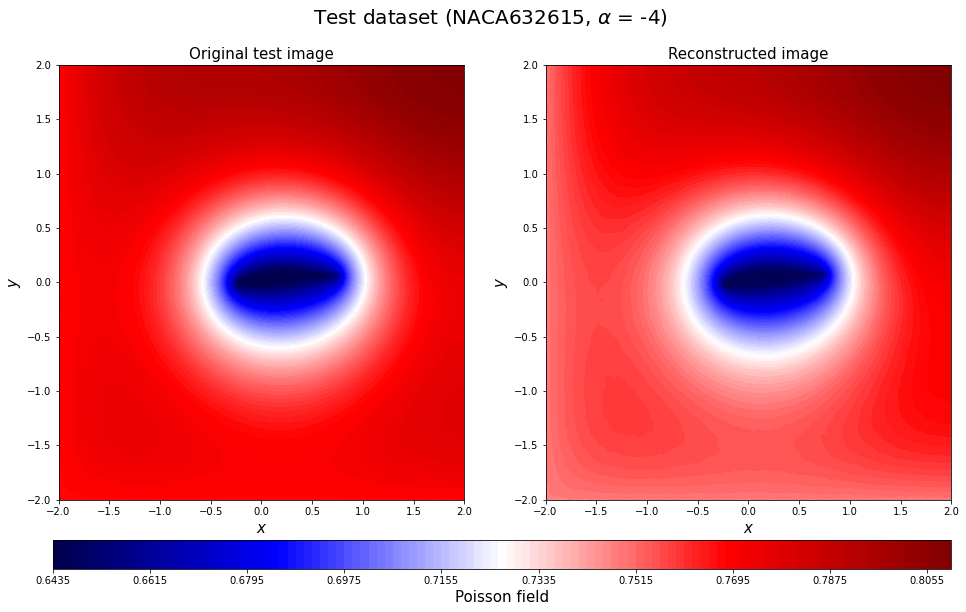

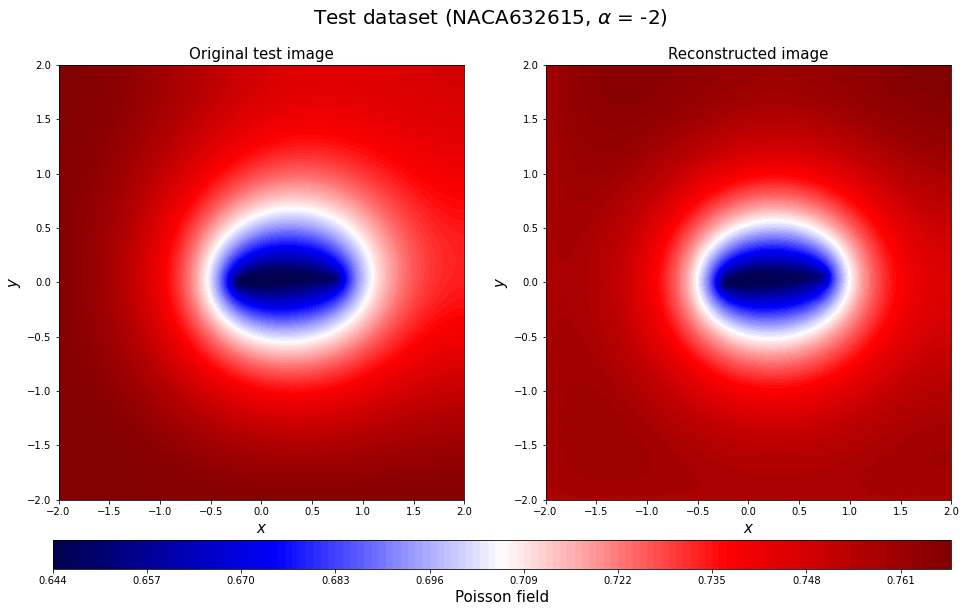

...

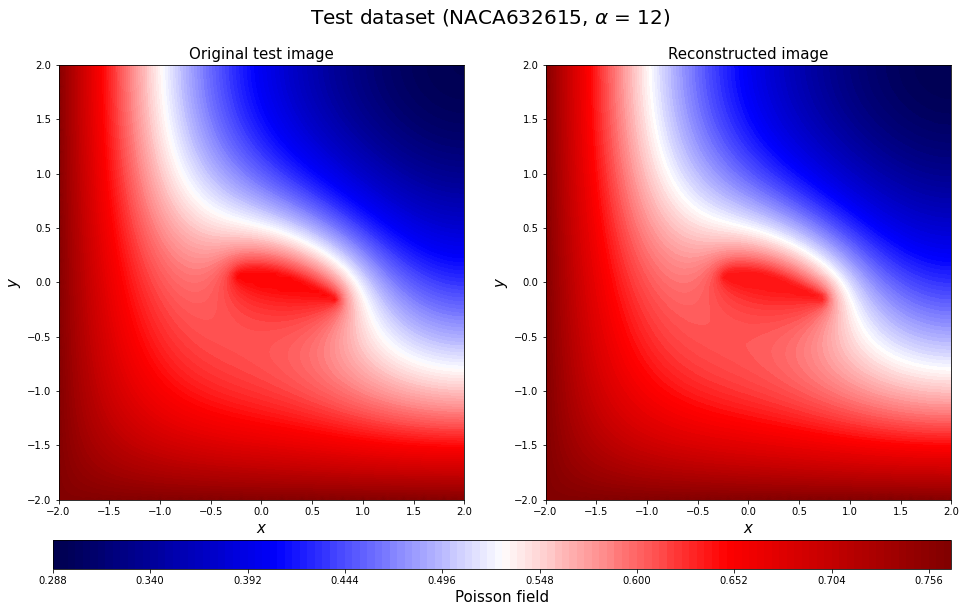

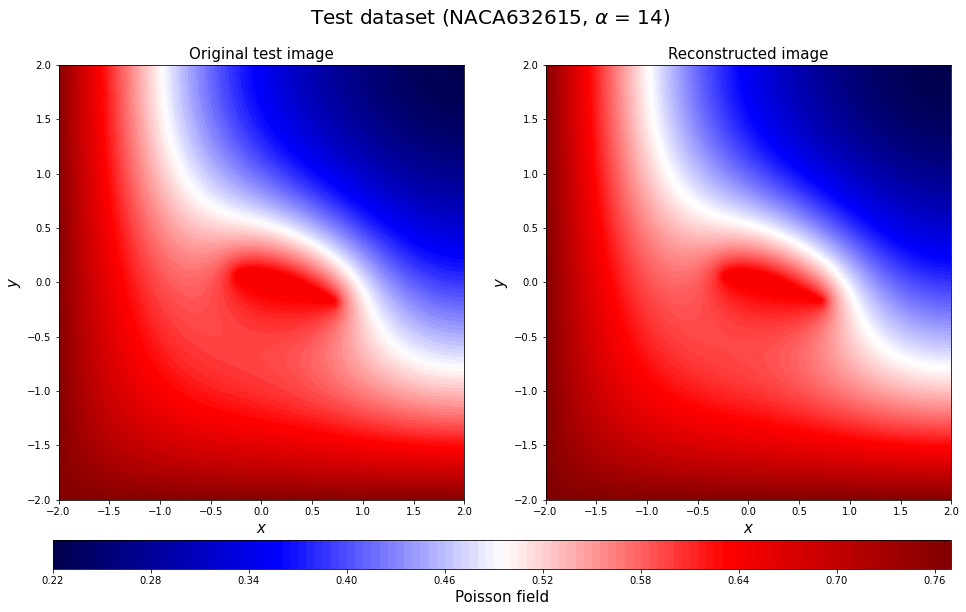

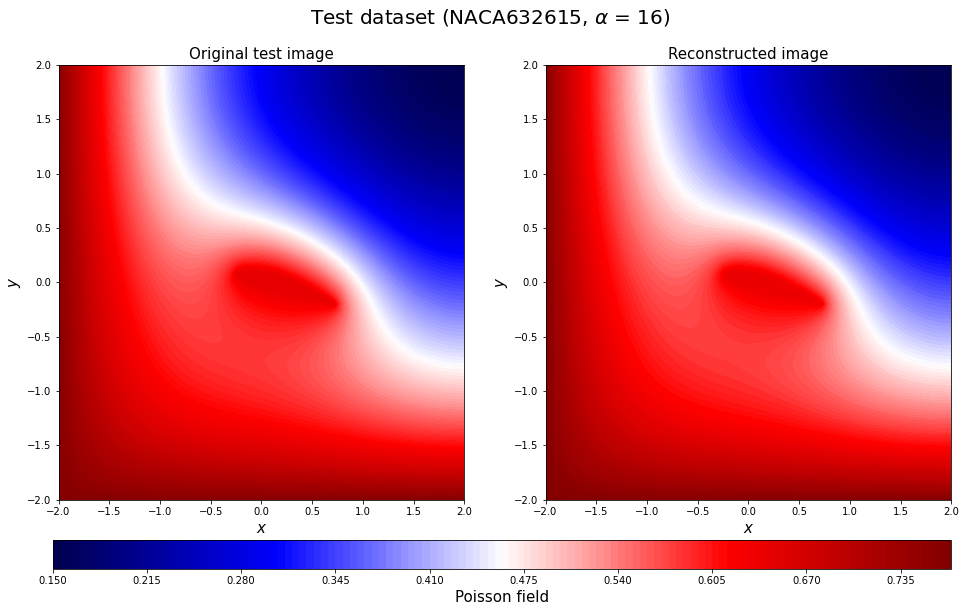

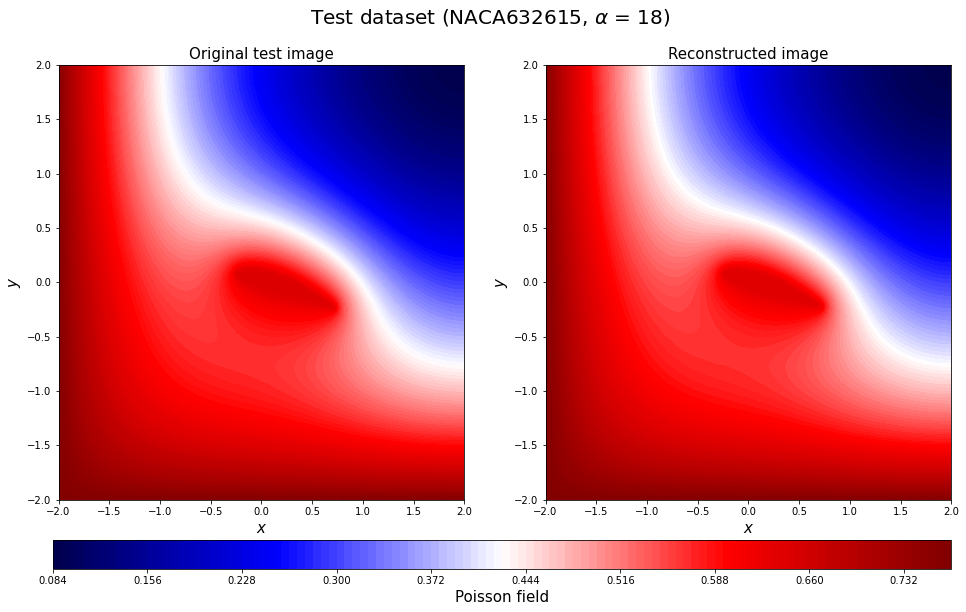

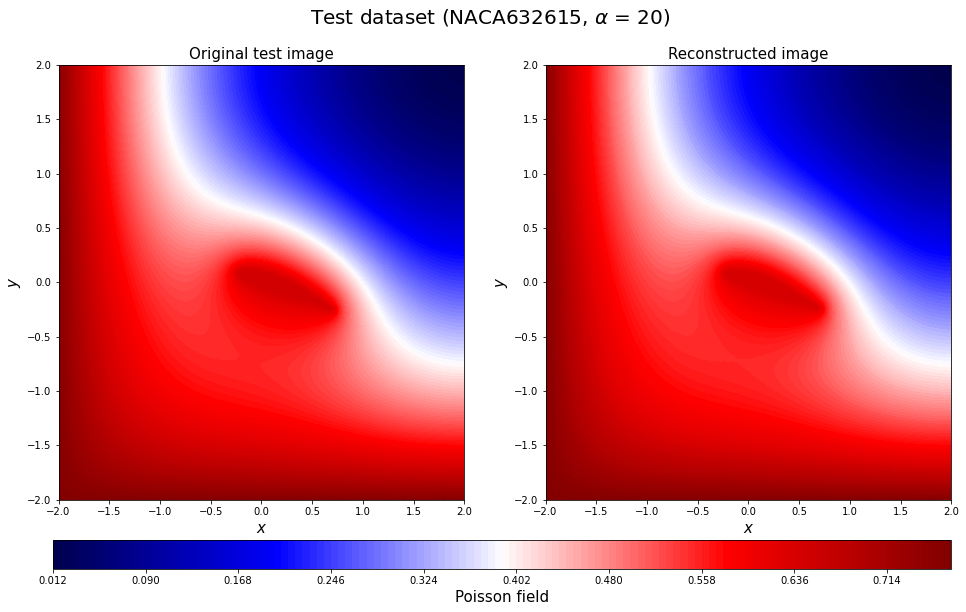

In [87]:
for c in range(96,112):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

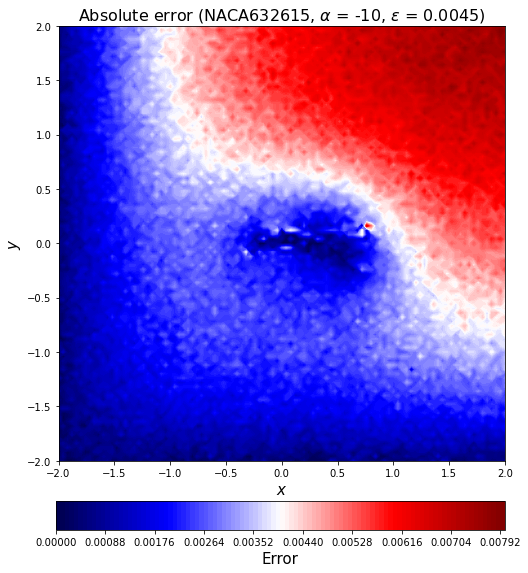

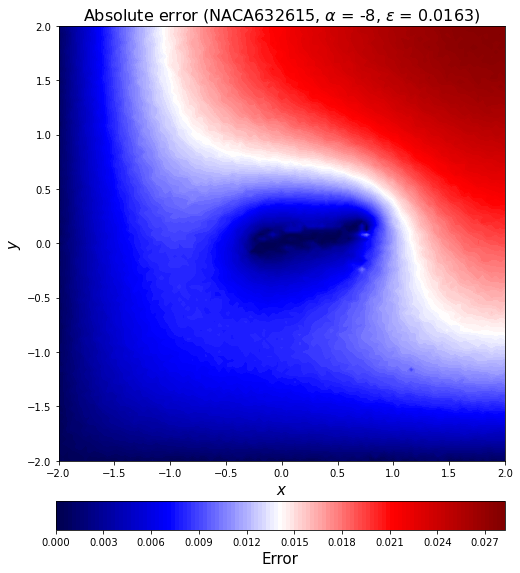

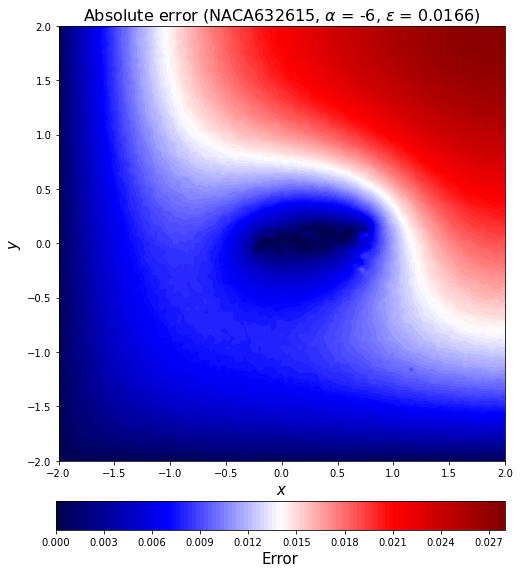

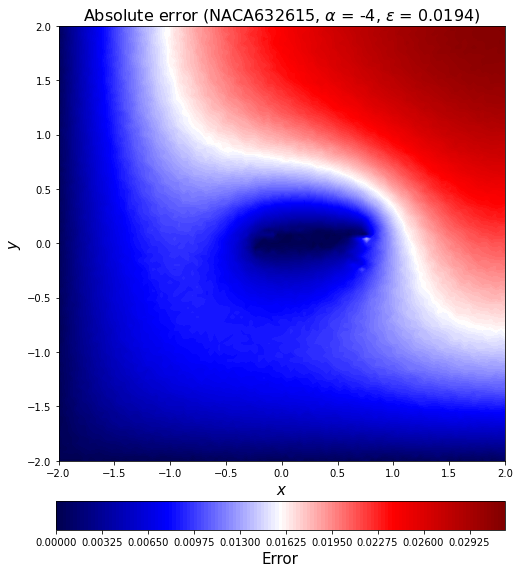

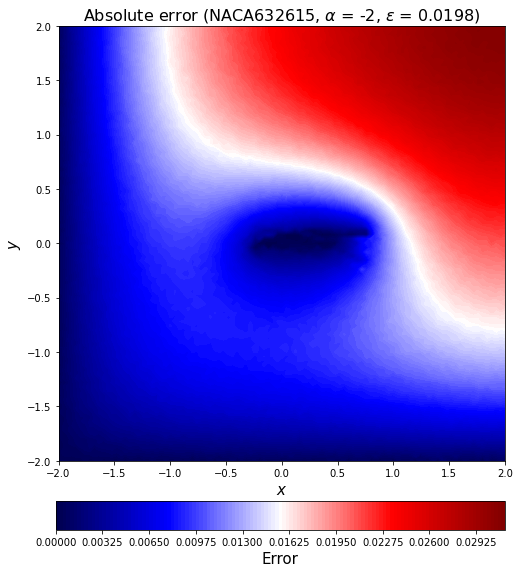

...

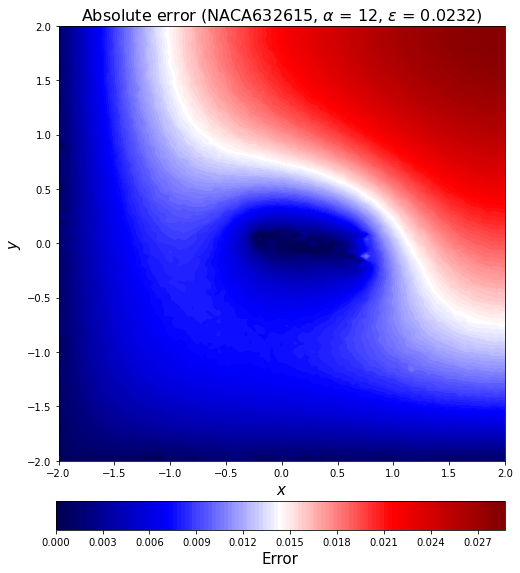

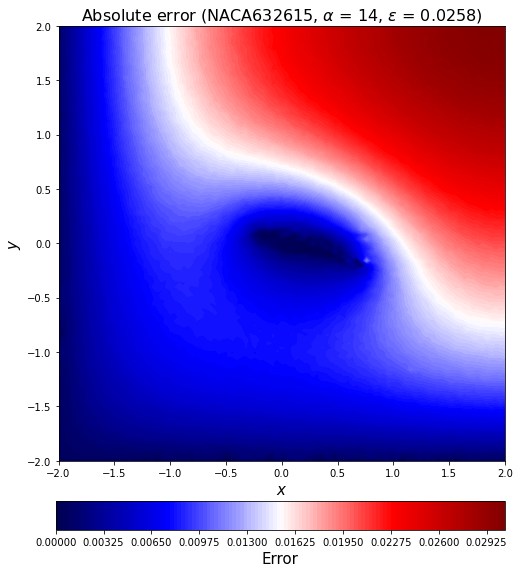

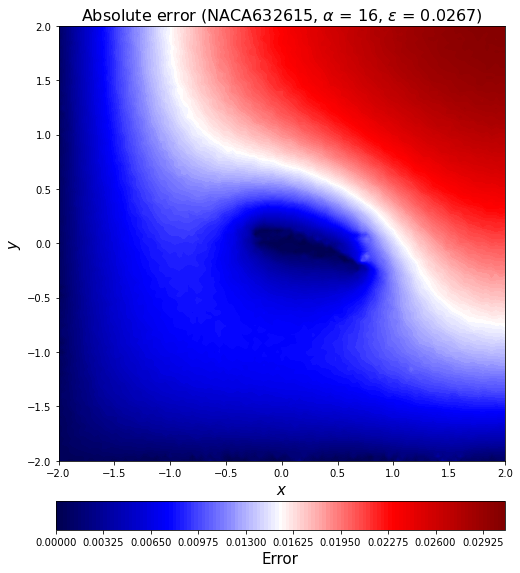

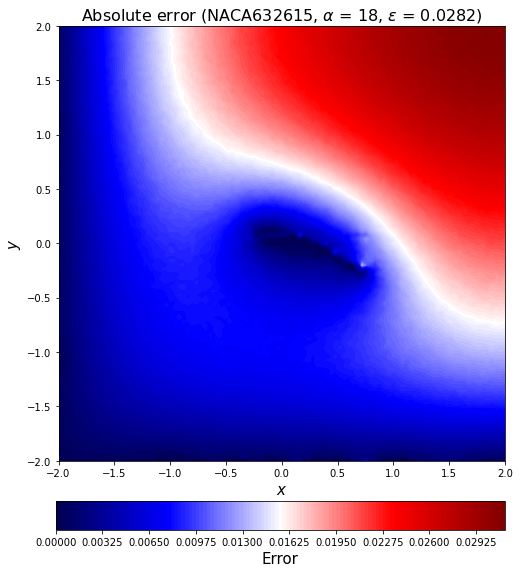

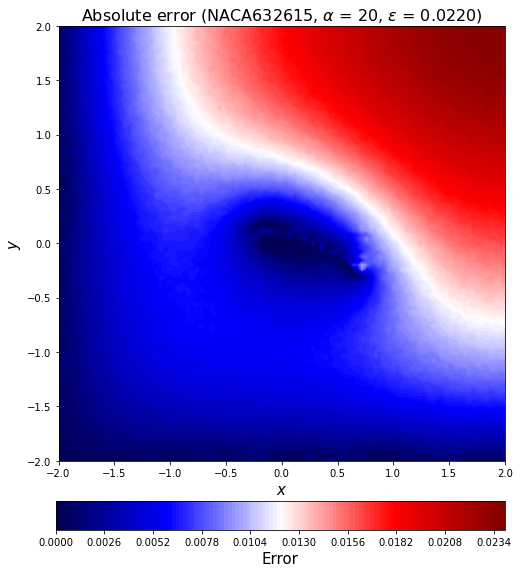

In [88]:
for c in range(96,112):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [1]:
yTrainSum = np.zeros((y_train.shape[0],1))
dTrainSum = np.zeros((decoded_train.shape[0], 1))
MAPE_train_list = np.zeros((y_train.shape[0], 1))
for i in range(0, y_train.shape[0]):
    yTrainSum[i,:] = np.sum(y_train[i])
    dTrainSum[i,:] = np.sum(decoded_train[i])
    MAPE_train_list[i,:] = np.abs((dTrainSum[i,:]-yTrainSum[i,:])/yTrainSum[i,:])
    
MAPE_train = 100/y_train.shape[0]*np.sum(np.abs((dTrainSum-yTrainSum)/yTrainSum))
print(MAPE_train)
acc_train = 1-MAPE_train
print(acc_train)
acc_train_list = 1 - MAPE_train_list

yValSum = np.zeros((y_val.shape[0],1))
dValSum = np.zeros((decoded_val.shape[0], 1))
MAPE_val_list = np.zeros((y_val.shape[0], 1))
for i in range(0, y_val.shape[0]):
    yValSum[i,:] = np.sum(y_val[i])
    dValSum[i,:] = np.sum(decoded_val[i])
    MAPE_val_list[i,:] = np.abs((dValSum[i,:]-yValSum[i,:])/yValSum[i,:])
    
MAPE_val = 100/y_val.shape[0]*np.sum(np.abs((dValSum-yValSum)/yValSum))
print(MAPE_val)
acc_val = 1-MAPE_val
print(acc_val)
acc_val_list = 1 - MAPE_val_list

yTestSum = np.zeros((y_test.shape[0],1))
dTestSum = np.zeros((decoded_test.shape[0], 1))
MAPE_test_list = np.zeros((y_test.shape[0], 1))
for i in range(0, y_test.shape[0]):
    yTestSum[i,:] = np.sum(y_test[i])
    dTestSum[i,:] = np.sum(decoded_test[i])
    MAPE_test_list[i,:] = np.abs((dTestSum[i,:]-yTestSum[i,:])/yTestSum[i,:])
    
MAPE_test = 100/y_test.shape[0]*np.sum(np.abs((dTestSum-yTestSum)/yTestSum))
print(MAPE_test)
acc_test = 1-MAPE_test
print(acc_test)
acc_test_list = 1 - MAPE_test_list

plt.hist(acc_train_list)
plt.title('Training set (accuracy) (random split)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
#plt.grid()
save_acc_name = "20221030Accuracy_Poisson_bc2(training).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

plt.hist(acc_val_list)
plt.title('Vallidation set (accuracy) (random split)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Poisson_bc2(validation).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

plt.hist(acc_test_list)
plt.title('Test set (accuracy) (random split)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Poisson_bc2(test).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

NameError: name 'np' is not defined